In [1]:
# Check the versions of libraries
 
# Python version
import sys
print('Python: {}'.format(sys.version))
# scipy
import scipy
print('scipy: {}'.format(scipy.__version__))
# numpy
import numpy
print('numpy: {}'.format(numpy.__version__))
# matplotlib
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))
# pandas
import pandas
print('pandas: {}'.format(pandas.__version__))
# scikit-learn
import sklearn
print('sklearn: {}'.format(sklearn.__version__))

Python: 3.7.9 (default, Aug 31 2020, 17:10:11) [MSC v.1916 64 bit (AMD64)]
scipy: 1.5.2
numpy: 1.18.5
matplotlib: 3.3.1
pandas: 1.1.1
sklearn: 0.23.2


In [2]:
# Load libraries
from numpy import log
from pandas import read_csv
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
# Load dataset
url = "f-air-quality-data.csv"
names = ['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)', 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)', 'Wind Speed (m/s)', 'Wind Direction', 'api_weather', 'date'
]
dataset = read_csv(url, names=names, header=0)

In [4]:
dataset.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),Wind Direction,api_weather,date
0,36.1,58.7,0.0,2.913,0.292,10.000,4.1,W,Clouds,2020-09-02 19:29:23.949000
1,35.8,58.7,0.0,2.733,0.280,10.000,4.1,W,Clouds,2020-09-02 19:49:24.133000
2,36.1,58.3,0.0,2.864,0.283,10.000,4.1,W,Clouds,2020-09-02 20:09:24.170000
3,35.7,59.3,17.0,2.877,0.267,10.000,3.6,W,Clouds,2020-09-02 20:29:24.207000
4,35.3,59.8,3.0,2.652,0.265,10.559,3.6,W,Clouds,2020-09-02 20:49:24.012000


In [5]:
dataset.dtypes

Temperature (°C)    float64
Humidity (%RH)      float64
PM25 (ug/m3)        float64
CO (PPM)            float64
NO2 (PPM)           float64
O3 (PPB)            float64
Wind Speed (m/s)    float64
Wind Direction       object
api_weather          object
date                 object
dtype: object

In [6]:
# check for nulls
dataset.isnull().sum()

Temperature (°C)    0
Humidity (%RH)      0
PM25 (ug/m3)        0
CO (PPM)            0
NO2 (PPM)           0
O3 (PPB)            0
Wind Speed (m/s)    0
Wind Direction      0
api_weather         0
date                0
dtype: int64

In [7]:
# see how well the data correlate against one another (particularly the APCs vs MFs)
dataset.corr()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s)
Temperature (°C),1.000000,-0.955189,0.029951,-0.140477,-0.247009,-0.029795,0.428161
Humidity (%RH),-0.955189,1.000000,-0.028794,0.150399,0.253681,-0.052110,-0.417319
PM25 (ug/m3),0.029951,-0.028794,1.000000,-0.016354,-0.006997,-0.003425,0.018089
CO (PPM),-0.140477,0.150399,-0.016354,1.000000,-0.074008,-0.224173,-0.156067
NO2 (PPM),-0.247009,0.253681,-0.006997,-0.074008,1.000000,-0.396870,-0.306331
O3 (PPB),-0.029795,-0.052110,-0.003425,-0.224173,-0.396870,1.000000,0.253206
Wind Speed (m/s),0.428161,-0.417319,0.018089,-0.156067,-0.306331,0.253206,1.000000


## We take only the hourly measurements

In [8]:
dataset = dataset[::3]

In [9]:
dataset.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),Wind Direction,api_weather,date
0,36.1,58.7,0.0,2.913,0.292,10.000,4.1,W,Clouds,2020-09-02 19:29:23.949000
3,35.7,59.3,17.0,2.877,0.267,10.000,3.6,W,Clouds,2020-09-02 20:29:24.207000
6,35.0,59.4,0.0,2.486,0.253,16.663,2.6,W,Clouds,2020-09-02 21:29:26.061000
9,35.1,59.1,7.0,3.041,0.270,12.623,2.6,SW,Clouds,2020-09-02 22:29:23.989000
12,34.7,60.0,0.0,2.833,0.262,12.020,1.5,W,Clouds,2020-09-02 23:29:29.660000


## Scale the NO2 PPM to PPB

In [10]:
dataset['NO2 (PPM)'].head()

0     0.292
3     0.267
6     0.253
9     0.270
12    0.262
Name: NO2 (PPM), dtype: float64

In [11]:
dataset['NO2 (PPM)'] *= 1000

In [12]:
dataset['NO2 (PPM)'].head()

0     292.0
3     267.0
6     253.0
9     270.0
12    262.0
Name: NO2 (PPM), dtype: float64

## Transform categorical columns to numerical values

In [13]:
# see categorical cell values
dataset['Wind Direction'].value_counts()

N     347
W     162
SE    151
E     140
SW     96
NW     89
NE     53
S      50
Name: Wind Direction, dtype: int64

In [14]:
dataset['api_weather'].value_counts()

Clouds               737
Rain                 317
Rain&Thunderstorm     13
Clear                 11
Thunderstorm           5
Thunderstorm&Rain      4
Rain&Mist              1
Name: api_weather, dtype: int64

In [15]:
# reformat api weather column to be consistent (make multi-valued item order not matter)
def reformat_weather(weather_string):
    weather_conditions = weather_string.split('&')
    if (len(weather_conditions) == 1):
        return weather_string
    else:
        idx = -1
        try:
            idx = weather_conditions.index('Rain')
        except ValueError:
            print('WARNING: multivalued item is not valid')
            return weather_string
        if (idx == 1):
            weather_conditions[0],weather_conditions[1] = weather_conditions[1],weather_conditions[0]
        return "&".join(weather_conditions)
    
    
dataset['api_weather'] = dataset['api_weather'].apply(reformat_weather)

In [16]:
dataset['api_weather'].value_counts()

Clouds               737
Rain                 317
Rain&Thunderstorm     17
Clear                 11
Thunderstorm           5
Rain&Mist              1
Name: api_weather, dtype: int64

In [17]:
# reformat categorical columns to numerical columns
lbl_encoder = LabelEncoder()
dataset['api_weather Code'] = lbl_encoder.fit_transform(dataset.api_weather)
dataset['Wind Direction Code'] = lbl_encoder.fit_transform(dataset['Wind Direction'])
dataset.drop(['Wind Direction', 'api_weather'], axis=1, inplace=True)

In [18]:
dataset['api_weather Code'].value_counts()

1    737
2    317
4     17
0     11
5      5
3      1
Name: api_weather Code, dtype: int64

In [19]:
dataset['Wind Direction Code'].value_counts()

1    347
7    162
5    151
0    140
6     96
3     89
2     53
4     50
Name: Wind Direction Code, dtype: int64

## Reformat datetime to index

In [20]:
dataset.date = pd.to_datetime(dataset.date, format='%Y-%m-%d %H:%M:%S')
dataset.index = dataset.date

In [21]:
dataset.drop(['date'], axis=1, inplace=True)

In [22]:
# shape
print(dataset.shape)

(1088, 9)


In [23]:
# head
dataset.head()

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
date,,,,,,,,,
2020-09-02 19:29:23.949,36.1,58.7,0.0,2.913,292.0,10.000,4.1,1,7
2020-09-02 20:29:24.207,35.7,59.3,17.0,2.877,267.0,10.000,3.6,1,7
2020-09-02 21:29:26.061,35.0,59.4,0.0,2.486,253.0,16.663,2.6,1,7
2020-09-02 22:29:23.989,35.1,59.1,7.0,3.041,270.0,12.623,2.6,1,6
2020-09-02 23:29:29.660,34.7,60.0,0.0,2.833,262.0,12.020,1.5,1,7


In [24]:
# descriptions
dataset.describe(include = 'all', datetime_is_numeric=True)

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
count,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000,1088.000000
mean,35.228885,57.902436,166.877681,5.489839,100.908563,51.121215,2.312151,1.348346,3.111213
std,2.300985,6.117448,2262.627337,2.922181,48.206144,34.016256,1.433315,0.631128,2.500698
min,30.600000,39.650000,0.000000,1.926000,10.000000,10.000000,0.350000,0.000000,0.000000
25%,33.450000,53.737500,8.000000,4.535125,68.500000,27.938000,1.000000,1.000000,1.000000
50%,34.800000,59.100000,14.000000,5.262000,102.000000,44.116000,2.100000,1.000000,3.000000
75%,36.800000,62.800000,23.500000,6.134000,125.500000,67.793250,3.100000,2.000000,5.000000
max,42.050000,76.300000,36280.000000,68.387000,362.500000,306.724000,8.700000,5.000000,7.000000


# Plot and check for outliers
Consider only the gases as they are susceptible to noise

In [25]:
plottable_ds = dataset.reset_index()

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

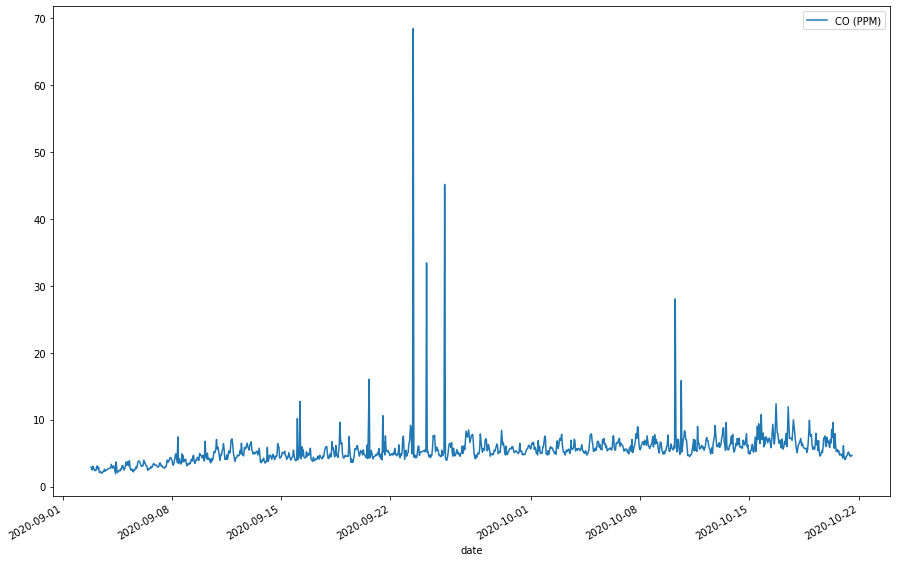

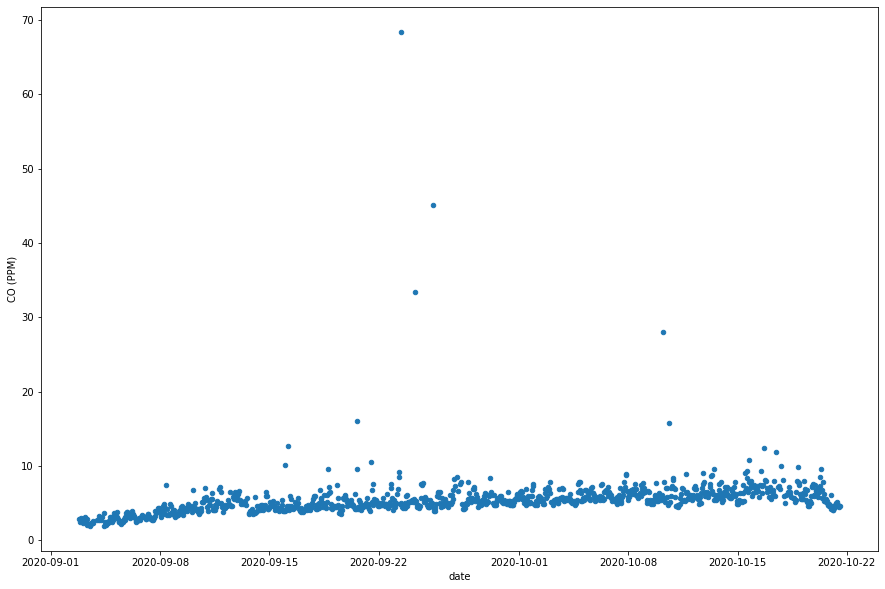

In [26]:
plottable_ds.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

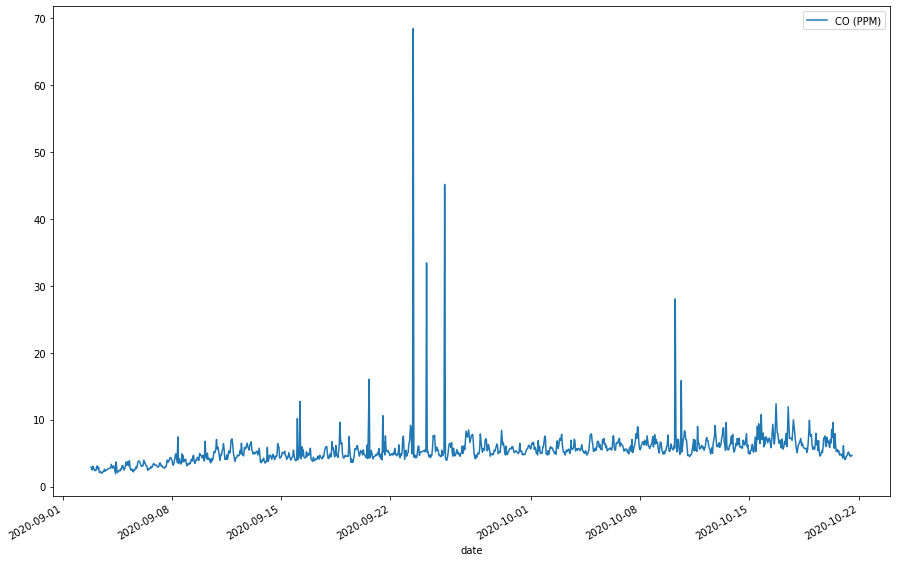

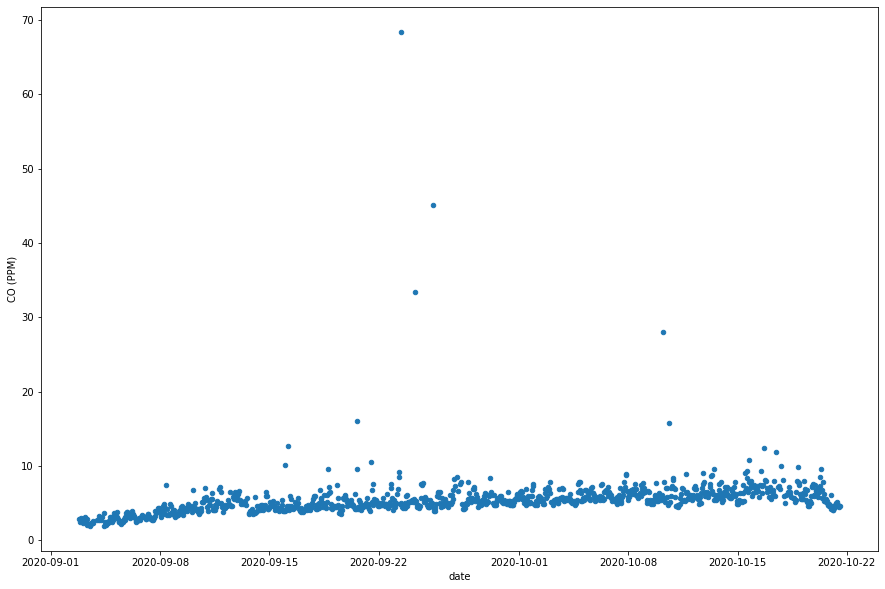

In [27]:
plottable_ds.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='NO2 (PPM)'>], dtype=object)

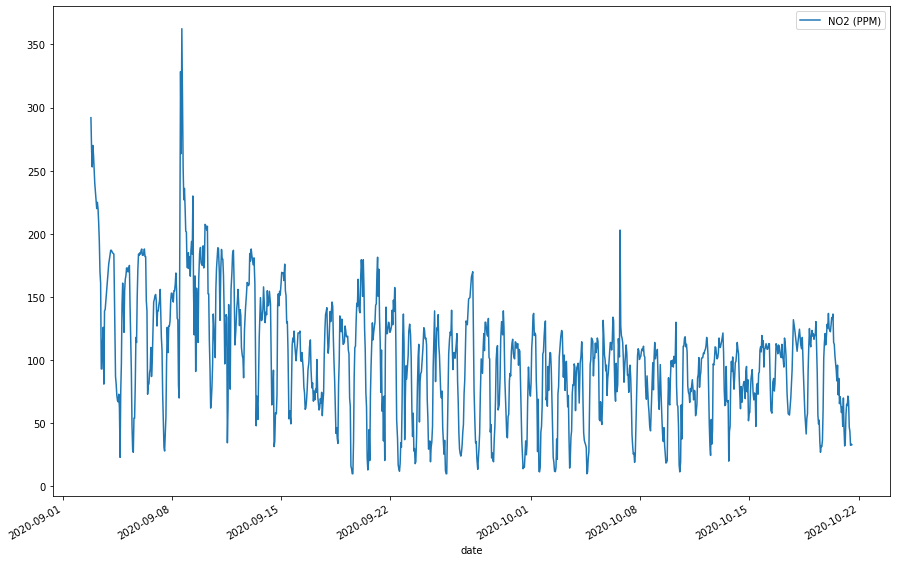

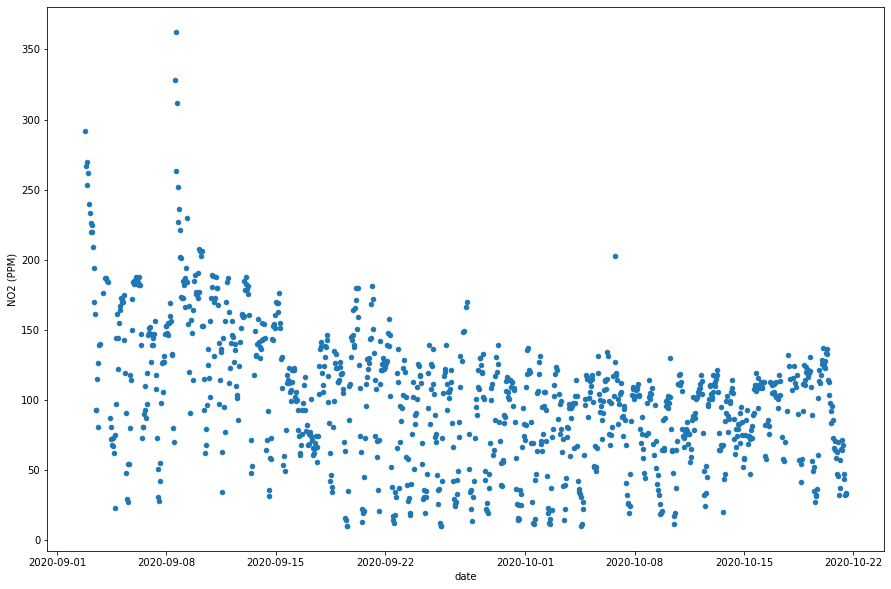

In [28]:
plottable_ds.plot(kind = 'line', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='O3 (PPB)'>], dtype=object)

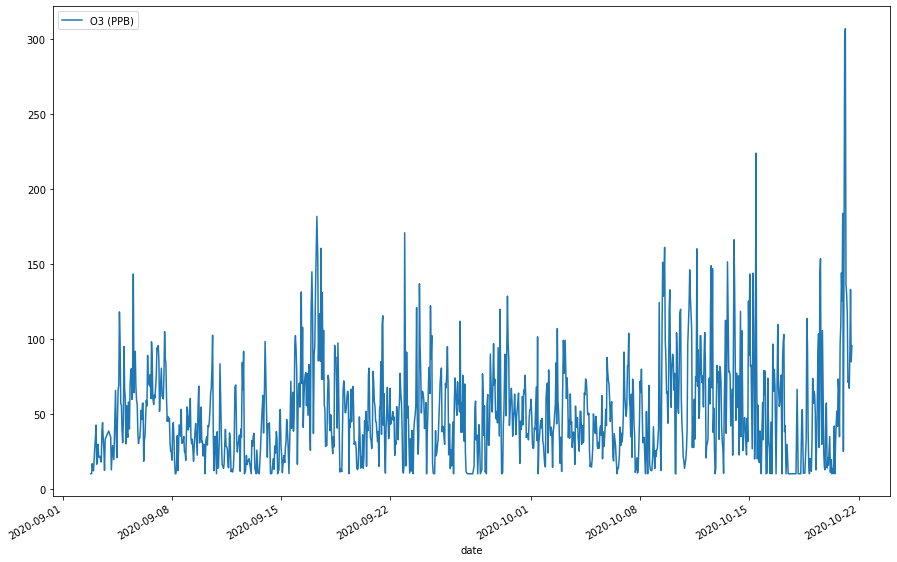

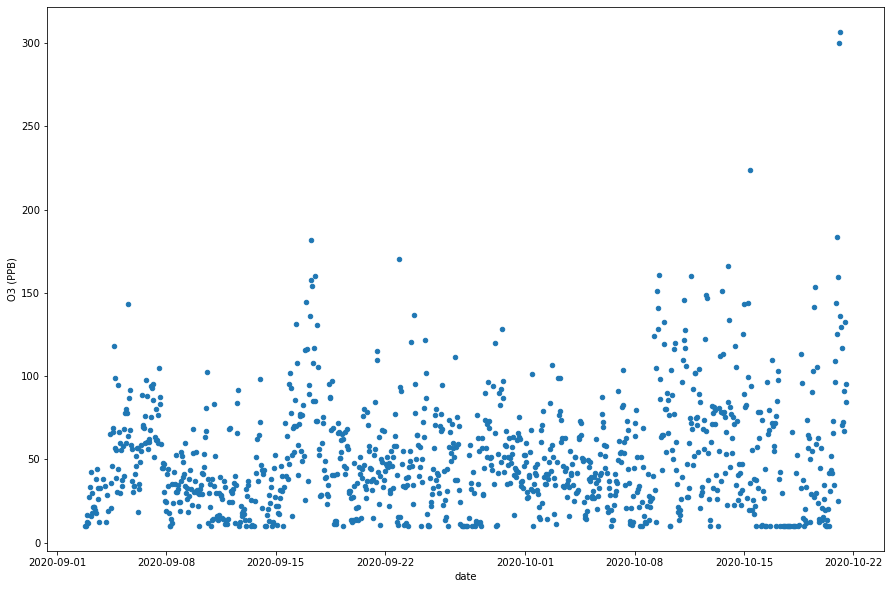

In [29]:
plottable_ds.plot(kind = 'line', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))

## Identifying Outliers with Skewness
[Reference](https://www.pluralsight.com/guides/cleaning-up-data-from-outliers)

In [30]:
print(dataset['PM25 (ug/m3)'].skew())
dataset['PM25 (ug/m3)'].describe()

15.452260004927922


count     1088.000000
mean       166.877681
std       2262.627337
min          0.000000
25%          8.000000
50%         14.000000
75%         23.500000
max      36280.000000
Name: PM25 (ug/m3), dtype: float64

In [31]:
print(dataset['CO (PPM)'].skew())
dataset['CO (PPM)'].describe()

12.83057262445107


count    1088.000000
mean        5.489839
std         2.922181
min         1.926000
25%         4.535125
50%         5.262000
75%         6.134000
max        68.387000
Name: CO (PPM), dtype: float64

In [32]:
print(dataset['NO2 (PPM)'].skew())
dataset['NO2 (PPM)'].describe()

0.6711193418876237


count    1088.000000
mean      100.908563
std        48.206144
min        10.000000
25%        68.500000
50%       102.000000
75%       125.500000
max       362.500000
Name: NO2 (PPM), dtype: float64

In [33]:
print(dataset['O3 (PPB)'].skew())
dataset['O3 (PPB)'].describe()

1.736110342552237


count    1088.000000
mean       51.121215
std        34.016256
min        10.000000
25%        27.938000
50%        44.116000
75%        67.793250
max       306.724000
Name: O3 (PPB), dtype: float64

# We need to remove those outliers!
## Best way to do this is by interpolating the outlier data since dropping the entire row will affect the other features

We consider two ways to do this:
1. [Use the quantile values to remove the outliers and then interpolate](#quantile_interpolation)
2. [Use the z-score to determine values which need to be interpolated and then interpolate](#zscore_interpolation)

## Use the quantile values to remove the outliers and then interpolate <a id='quantile_interpolation'>[1]</a>
We use the median value to interpolate the outliers

In [34]:
pm25_max_threshold, pm25_min_threshold = dataset['PM25 (ug/m3)'].quantile([0.99, 0.01])
print('pm25 max threshold: ' + str(pm25_max_threshold))
print('pm25 min threshold: ' + str(pm25_min_threshold))

co_max_threshold, co_min_threshold = dataset['CO (PPM)'].quantile([0.99, 0.01])
print('co max threshold: ' + str(co_max_threshold))
print('co min threshold: ' + str(co_min_threshold))

no2_max_threshold, no2_min_threshold = dataset['NO2 (PPM)'].quantile([0.99, 0.01])
print('no2 max threshold: ' + str(no2_max_threshold))
print('no2 min threshold: ' + str(no2_min_threshold))

o3_max_threshold, o3_min_threshold = dataset['O3 (PPB)'].quantile([0.99, 0.01])
print('o3 max threshold: ' + str(o3_max_threshold))
print('o3 min threshold: ' + str(o3_min_threshold))

pm25 max threshold: 70.12999999999988
pm25 min threshold: 0.0
co max threshold: 10.223264999999948
co min threshold: 2.275
no2 max threshold: 236.51999999999956
no2 min threshold: 12.0
o3 max threshold: 157.96385999999978
o3 min threshold: 10.0


In [35]:
# identify how many we need to interpolate

ol_count = dataset[ (dataset['PM25 (ug/m3)'] < pm25_min_threshold) | (dataset['PM25 (ug/m3)'] > pm25_max_threshold) ].shape[0]
print('pm25 outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['CO (PPM)'] < co_min_threshold) | (dataset['CO (PPM)'] > co_max_threshold) ].shape[0]
print('co outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['NO2 (PPM)'] < no2_min_threshold) | (dataset['NO2 (PPM)'] > no2_max_threshold) ].shape[0]
print('no2 outliers: {}'.format(ol_count))
ol_count = dataset[ (dataset['O3 (PPB)'] < o3_min_threshold) | (dataset['O3 (PPB)'] > o3_max_threshold) ].shape[0]
print('o3 outliers: {}'.format(ol_count))

pm25 outliers: 11
co outliers: 21
no2 outliers: 20
o3 outliers: 11


In [36]:
# get the median value for the dataset
pm25_median = dataset['PM25 (ug/m3)'].quantile(0.5)
co_median = dataset['CO (PPM)'].quantile(0.5)
no2_median = dataset['NO2 (PPM)'].quantile(0.5)
o3_median = dataset['O3 (PPB)'].quantile(0.5)

In [37]:
dataset['PM25 (ug/m3)'] = dataset['PM25 (ug/m3)'].apply(lambda x: x if x <= pm25_max_threshold and x >= pm25_min_threshold
                                  else pm25_median)
dataset['CO (PPM)'] = dataset['CO (PPM)'].apply(lambda x: x if x <= co_max_threshold and x >= co_min_threshold
                                  else co_median)
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].apply(lambda x: x if x <= no2_max_threshold and x >= no2_min_threshold
                                  else no2_median)
dataset['O3 (PPB)'] = dataset['O3 (PPB)'].apply(lambda x: x if x <= o3_max_threshold and x >= o3_min_threshold
                                  else o3_median)

## We use the zscore to determine values which need to be interpolated <a id='zscore_interpolation'>[2] </a>
[Stackoverflow solution for this scenario](https://stackoverflow.com/questions/59678724/replace-given-columns-outliers-with-mean-of-before-and-after-rows-values-in-pa)

In [ ]:
from scipy import stats

In [ ]:
mask = (np.abs(stats.zscore(dataset['PM25 (ug/m3)'])) > 1.65)
dataset['PM25 (ug/m3)'] = dataset['PM25 (ug/m3)'].mask(mask).interpolate()

In [ ]:
mask = (np.abs(stats.zscore(dataset['CO (PPM)'])) > 1.65)
dataset['CO (PPM)'] = dataset['CO (PPM)'].mask(mask).interpolate()

In [ ]:
mask = (np.abs(stats.zscore(dataset['NO2 (PPM)'])) > 1.65)
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].mask(mask).interpolate()

In [ ]:
mask = (np.abs(stats.zscore(dataset['O3 (PPB)'])) > 1.65)
dataset['O3 (PPB)'] = dataset['O3 (PPB)'].mask(mask).interpolate()

In [ ]:
# check for nulls
dataset.isnull().sum()

In [ ]:
# fill nulls with median value
dataset['NO2 (PPM)'] = dataset['NO2 (PPM)'].fillna(dataset['NO2 (PPM)'].quantile(0.5))

In [ ]:
# check for nulls again
dataset.isnull().sum()

## Again, Let's identify outliers with skewness
[Reference](https://www.pluralsight.com/guides/cleaning-up-data-from-outliers)

In [28]:
print(dataset['PM25 (ug/m3)'].skew())
dataset['PM25 (ug/m3)'].describe()

0.922685282091025


count    1088.000000
mean       16.096890
std        11.860271
min         0.000000
25%         8.000000
50%        14.000000
75%        23.000000
max        70.000000
Name: PM25 (ug/m3), dtype: float64

In [29]:
print(dataset['CO (PPM)'].skew())
dataset['CO (PPM)'].describe()

0.31441704368152795


count    1088.000000
mean        5.328102
std         1.326192
min         2.275000
25%         4.559125
50%         5.262000
75%         6.095625
max        10.166000
Name: CO (PPM), dtype: float64

In [30]:
print(dataset['NO2 (PPM)'].skew())
dataset['NO2 (PPM)'].describe()

0.23461811378423938


count    1088.000000
mean       99.844072
std        43.707702
min        12.000000
25%        70.000000
50%       102.000000
75%       124.000000
max       236.000000
Name: NO2 (PPM), dtype: float64

In [31]:
print(dataset['O3 (PPB)'].skew())
dataset['O3 (PPB)'].describe()

0.9570346400828946


count    1088.000000
mean       49.569667
std        30.161635
min        10.000000
25%        27.938000
50%        44.108500
75%        66.946000
max       157.714000
Name: O3 (PPB), dtype: float64

## Let's plot again

In [38]:
plottable_ds = dataset.reset_index()

array([<AxesSubplot:xlabel='date', ylabel='PM25 (ug/m3)'>], dtype=object)

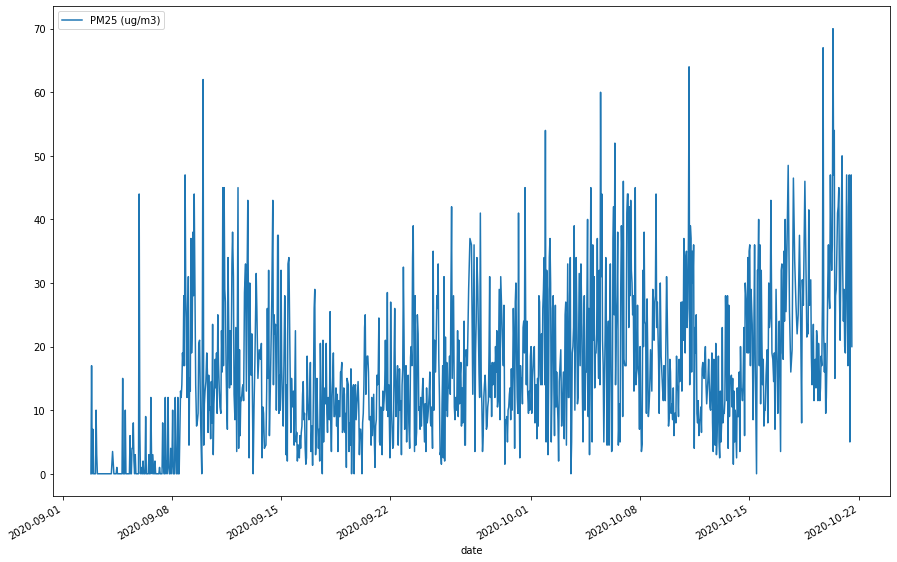

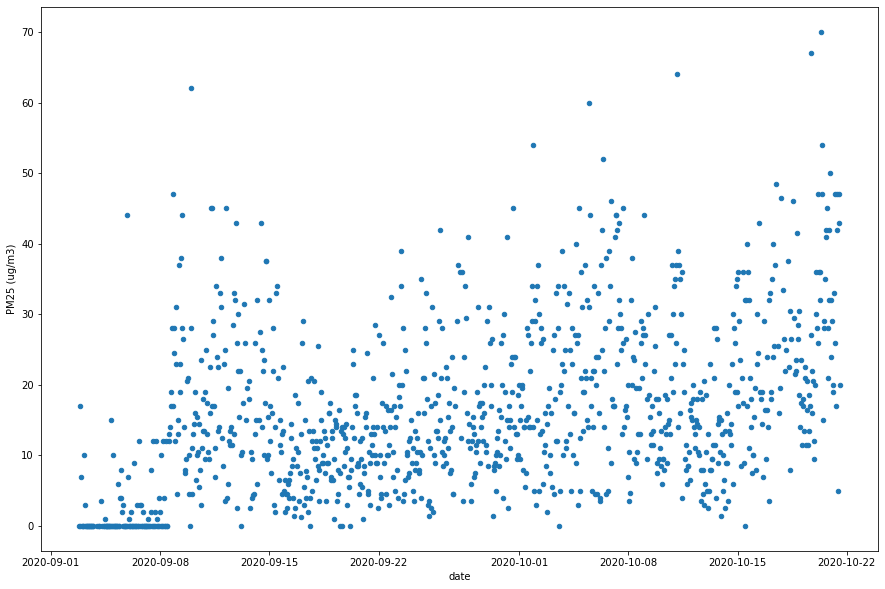

In [39]:
plottable_ds.plot(kind = 'line', x='date', y='PM25 (ug/m3)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='PM25 (ug/m3)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='CO (PPM)'>], dtype=object)

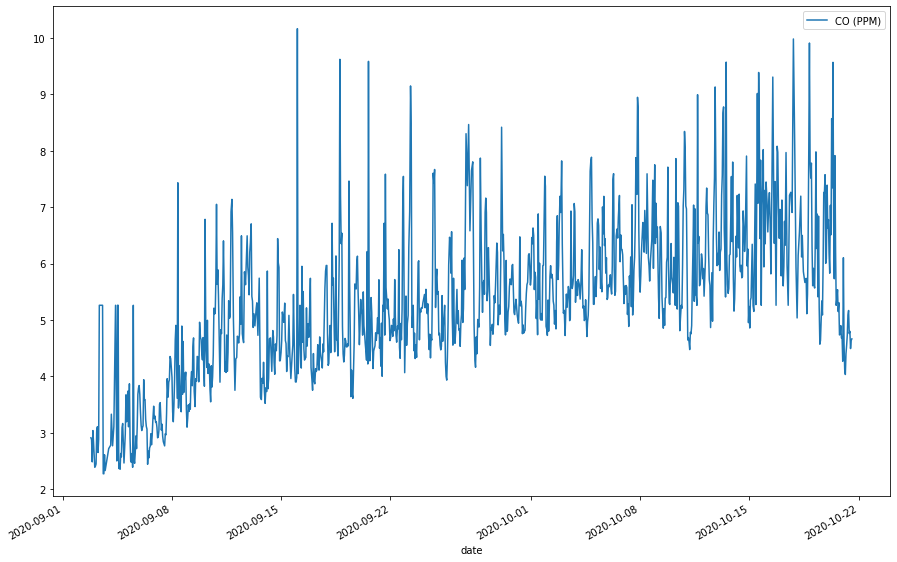

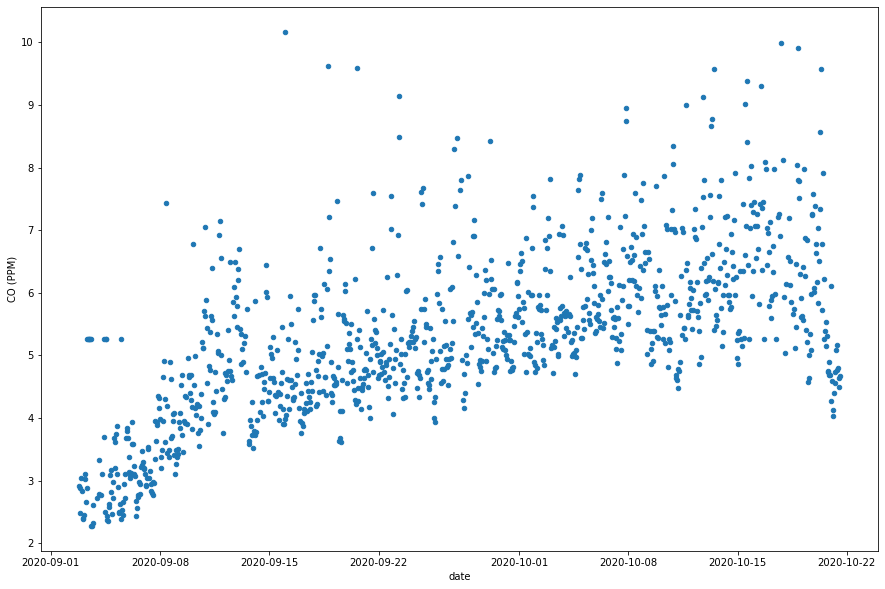

In [40]:
plottable_ds.plot(kind = 'line', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='CO (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='NO2 (PPM)'>], dtype=object)

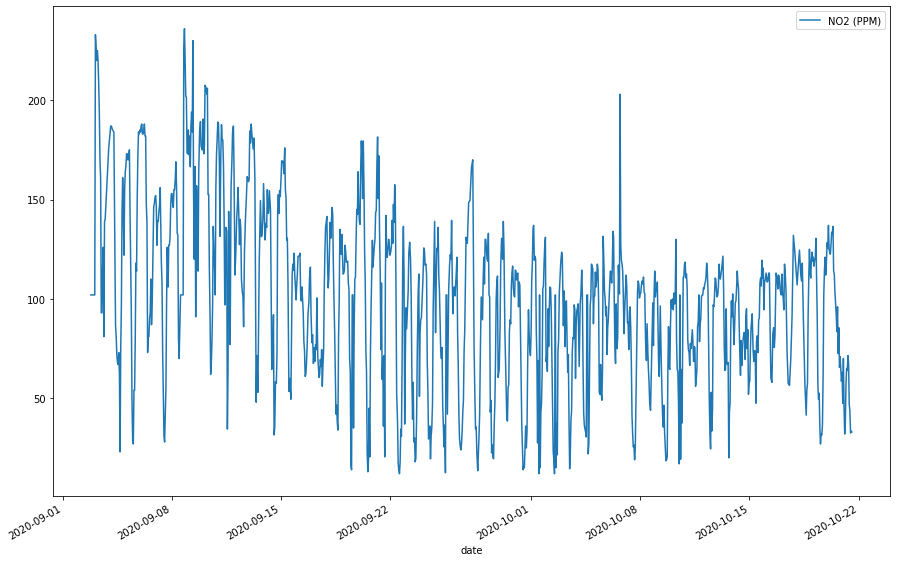

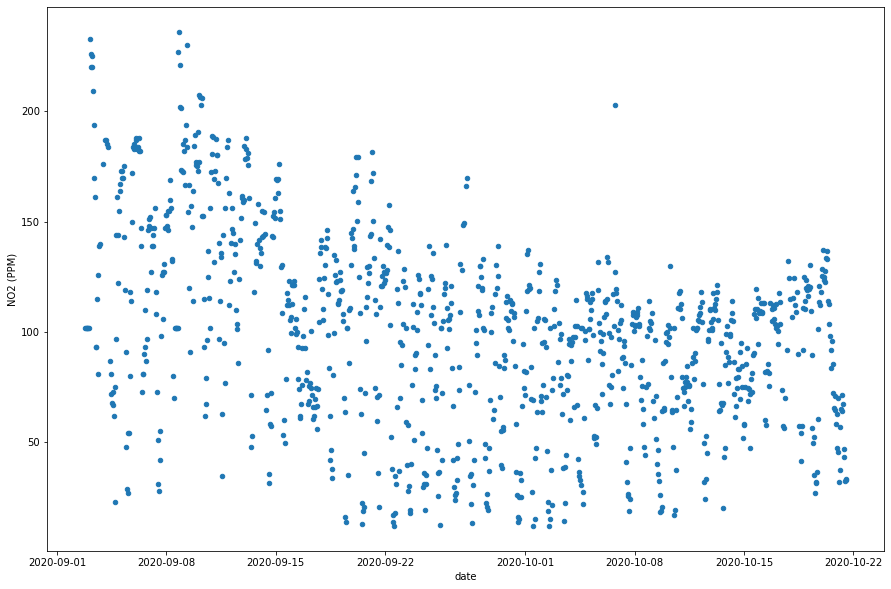

In [41]:
plottable_ds.plot(kind = 'line', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='NO2 (PPM)', subplots=True, figsize=(15,10))

array([<AxesSubplot:xlabel='date', ylabel='O3 (PPB)'>], dtype=object)

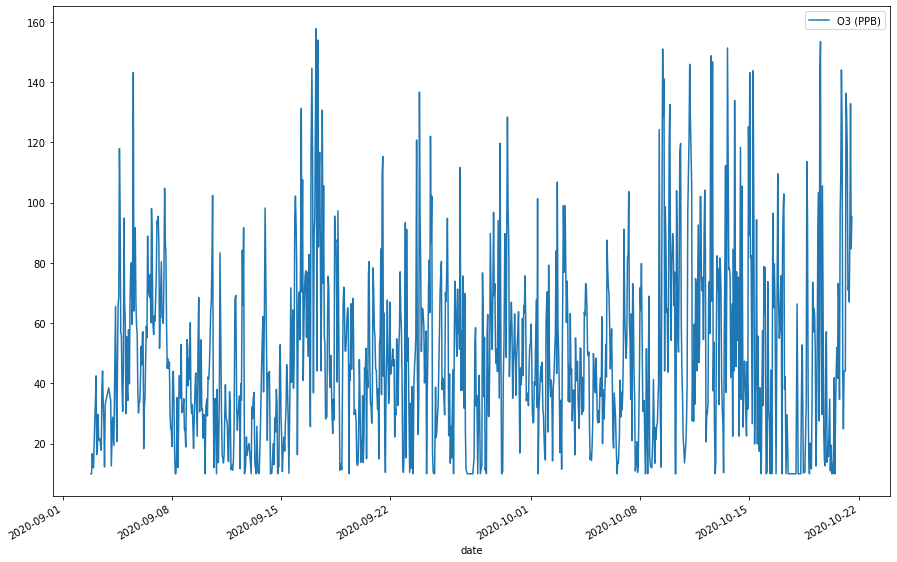

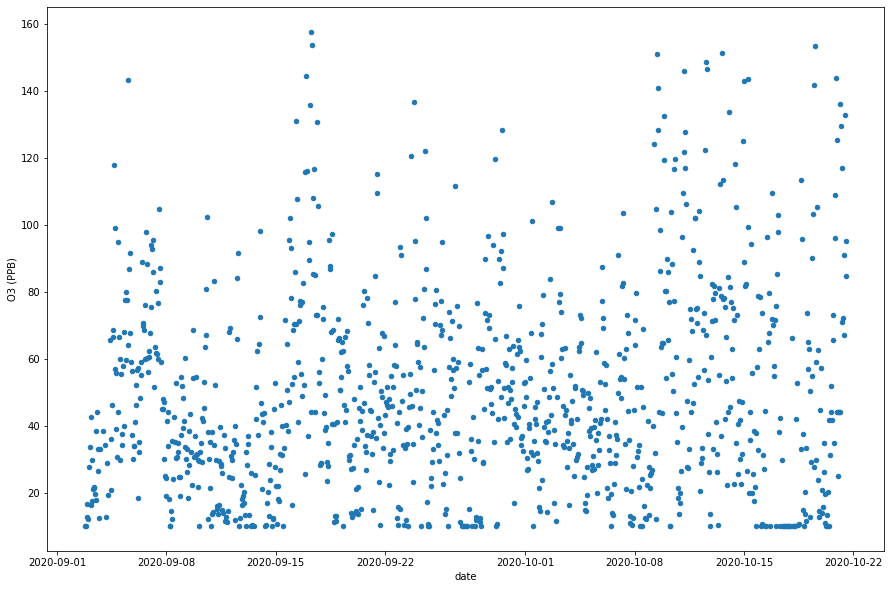

In [42]:
plottable_ds.plot(kind = 'line', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))
plottable_ds.plot(kind = 'scatter', x='date', y='O3 (PPB)', subplots=True, figsize=(15,10))

# Do statistical tests and do transformations if necessary
[Reference](https://machinelearningmastery.com/time-series-data-stationary-python/)

<AxesSubplot:>

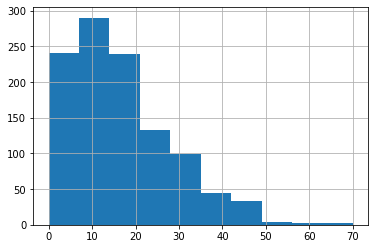

In [43]:
dataset['PM25 (ug/m3)'].hist()

<AxesSubplot:>

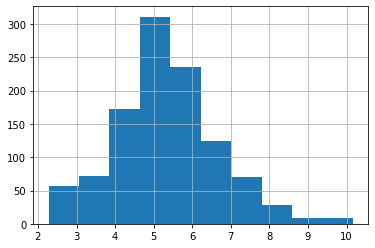

In [44]:
dataset['CO (PPM)'].hist()

<AxesSubplot:>

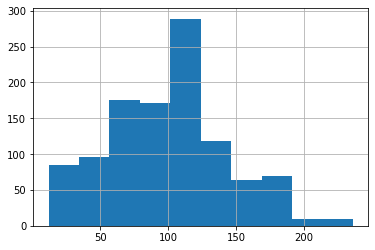

In [45]:
dataset['NO2 (PPM)'].hist()

<AxesSubplot:>

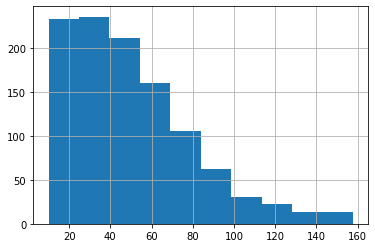

In [46]:
dataset['O3 (PPB)'].hist()

## Box plot

<AxesSubplot:>

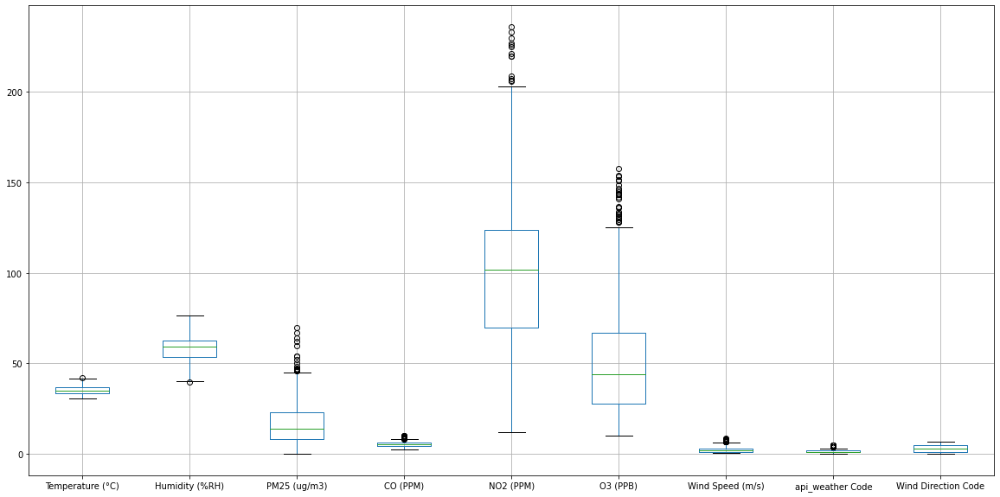

In [47]:
dataset.boxplot(figsize = (20,10))

## Augmented Dickey-Fuller test (test for stationarity)
[reference article for this code](https://www.analyticsvidhya.com/blog/2018/09/non-stationary-time-series-python/)

**Null Hypothesis**: The series has a unit root (value of a =1)

**Alternate Hypothesis**: The series has no unit root. (series is stationary)

In [50]:
from statsmodels.tsa.stattools import adfuller

In [136]:
#define function for ADF test
def adf_test(timeseries):
    #Perform Dickey-Fuller test:
    print ('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
       dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

col_names = [name for name in dataset.columns]
for col_name in col_names:
    print('Testing column: ' + col_name)
    print(adf_test(dataset[col_name]))
    print('================================')

Testing column: Temperature (°C)
Results of Dickey-Fuller Test:
Test Statistic                   -2.412163
p-value                           0.138333
#Lags Used                       20.000000
Number of Observations Used    1067.000000
Critical Value (1%)              -3.436493
Critical Value (5%)              -2.864253
Critical Value (10%)             -2.568214
dtype: float64
Testing column: Humidity (%RH)
Results of Dickey-Fuller Test:
Test Statistic                   -3.306870
p-value                           0.014574
#Lags Used                       19.000000
Number of Observations Used    1068.000000
Critical Value (1%)              -3.436488
Critical Value (5%)              -2.864250
Critical Value (10%)             -2.568213
dtype: float64
Testing column: PM25 (ug/m3)
Results of Dickey-Fuller Test:
Test Statistic                   -3.792968
p-value                           0.002980
#Lags Used                       13.000000
Number of Observations Used    1074.000000
Critical V

## KPSS (Kwiatkowski-Phillips-Schmidt-Shin) Test
[same article as above](https://www.analyticsvidhya.com/blog/2018/09/non-stationary-time-series-python/)

**Null Hypothesis**: The process is trend stationary.

**Alternate Hypothesis**: The series has a unit root (series is not stationary).

In [52]:
from statsmodels.tsa.stattools import kpss

In [137]:
#define KPSS
def kpss_test(timeseries):
    print ('Results of KPSS Test:')
    kpsstest = kpss(timeseries, regression='c', nlags="auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    for key,value in kpsstest[3].items():
        kpss_output['Critical Value (%s)'%key] = value
    return kpss_output
    
col_names = [name for name in dataset.columns]
for col_name in col_names:
    print('Testing column: ' + col_name)
    print(kpss_test(dataset[col_name]))
    print('================================')

Testing column: Temperature (°C)
Results of KPSS Test:
Test Statistic            2.345897
p-value                   0.010000
Lags Used                18.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64
Testing column: Humidity (%RH)
Results of KPSS Test:
Test Statistic            2.1865
p-value                   0.0100
Lags Used                18.0000
Critical Value (10%)      0.3470
Critical Value (5%)       0.4630
Critical Value (2.5%)     0.5740
Critical Value (1%)       0.7390
dtype: float64
Testing column: PM25 (ug/m3)
Results of KPSS Test:
Test Statistic            2.651433
p-value                   0.010000
Lags Used                17.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64
Testing column: CO (PPM)
Results of KPSS Test:
Test Statistic            4.

E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Me

Now let's combine the two test in a function to find out which is which (refer to the article for the assumptions below)

In [138]:
def determine_stationary(time_series):
    adf_test_res = adf_test(time_series)
    kpss_test_res = kpss_test(time_series)
    adf_is_stationary = adf_test_res[1] < 0.05
    kpss_is_stationary = kpss_test_res[1] >= 0.05
    
    if adf_is_stationary and kpss_is_stationary:
        print(time_series.name + ' is stationary!')
    elif not adf_is_stationary and not kpss_is_stationary:
        print(time_series.name + ' is NOT stationary!')
    elif not adf_is_stationary and kpss_is_stationary:
        print(time_series.name + ' is trend stationary!')
    elif adf_is_stationary and not kpss_is_stationary:
        print(time_series.name + ' is difference stationary!')

In [139]:
col_names = [name for name in dataset.columns]
for col_name in col_names:
    print(determine_stationary(dataset[col_name]))
    print('================================')

Results of Dickey-Fuller Test:
Results of KPSS Test:
Temperature (°C) is NOT stationary!
None
Results of Dickey-Fuller Test:
Results of KPSS Test:
Humidity (%RH) is difference stationary!
None
Results of Dickey-Fuller Test:
Results of KPSS Test:
PM25 (ug/m3) is difference stationary!
None
Results of Dickey-Fuller Test:
Results of KPSS Test:
CO (PPM) is NOT stationary!
None
Results of Dickey-Fuller Test:
Results of KPSS Test:


E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Me

NO2 (PPM) is NOT stationary!
None
Results of Dickey-Fuller Test:
Results of KPSS Test:
O3 (PPB) is stationary!
None
Results of Dickey-Fuller Test:
Results of KPSS Test:
Wind Speed (m/s) is difference stationary!
None
Results of Dickey-Fuller Test:
Results of KPSS Test:
api_weather Code is difference stationary!
None
Results of Dickey-Fuller Test:
Results of KPSS Test:
Wind Direction Code is stationary!
None


E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1874: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(warn_msg.format(direction="smaller"), InterpolationWarning)
E:\Users\Luis_Mercado\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:1876: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(warn_msg.format(direction="greater"), InterpolationWarning)


It is important to apply the transformations later in the preprocessing step before the machine learning procedure!

# Apply a feature engineering technique

## Reformat the time series data to a supervised machine learning problem
That is, make the inputs (MFs and APCs) be related to its past inputs (features) in predicting its future outputs (label)

![Feature engineering of the data](figs/ml_test/feature_engineering.png)

In [150]:
from pandas import DataFrame
from pandas import concat

### Lagging series function helpers

In [151]:
def transform_series_to_lag_dataframe(series, window_size=1, exclude_original=False):
    df_out = DataFrame()
    
    if window_size < 1:
        window_size = 1
    # concatenate the lagging series to the dataframe, 
    #   start from highest index to preserve order of the lagging series (current series should be at last column)
    for count in range(window_size, 0, -1):
        df_out[series.name + '(t-{})'.format(count)] = series.shift(count)
    # concatenate the original series, if desired
    if not exclude_original:
        df_out[series.name] = series
    return df_out

def transform_dataframe_to_lag_dataframe(dataframe, include_columns=None, window_size=1, drop_nan=True):
    df_out = DataFrame()
    if window_size < 1:
        window_size = 1
    if include_columns is None:
        return dataframe
    # concatenate each lagging dataframe to the new dataframe
    for column in dataframe.columns:
        if column in include_columns:
            lag_df = transform_series_to_lag_dataframe(dataframe[column], window_size, exclude_original=False)
        else:
            lag_df = dataframe[column]
        df_out = concat([df_out,lag_df], axis=1)
    if drop_nan:
        df_out.dropna(inplace=True)
    return df_out

In [152]:
sv_data =  transform_dataframe_to_lag_dataframe(dataset, 
                                                include_columns=['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)',
                                                                 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)',
                                                                 'Wind Speed (m/s)', 'Wind Direction Code', 'api_weather Code'
                                                                ], window_size=12, drop_nan=True)

### Leading series function helpers

In [153]:
def transform_series_to_lead_dataframe(series, forecast_size=1, exclude_original=False):
    df_out = DataFrame()
    
    if forecast_size < 1:
        forecast_size = 1
    # concatenate the original series, if desired
    if not exclude_original:
        df_out[series.name] = series
    # concatenate the leading series to the dataframe, 
    #   start from lowest index to preserve order of the leading series (current series should be at first column)
    for count in range(1, forecast_size + 1, 1):
        df_out[series.name + '(t+{})'.format(count)] = series.shift(-count)
    return df_out

def transform_dataframe_to_lead_dataframe(dataframe, include_columns=None, forecast_size=1, drop_nan=True):
    df_out = DataFrame()
    if forecast_size < 1:
        forecast_size = 1
    if include_columns is None:
        return dataframe
    # concatenate each leading dataframe to the new dataframe
    for column in dataframe.columns:
        if column in include_columns:
            lag_df = transform_series_to_lead_dataframe(dataframe[column], forecast_size, exclude_original=False)
        else:
            lag_df = dataframe[column]
        df_out = concat([df_out,lag_df], axis=1)
    if drop_nan:
        df_out.dropna(inplace=True)
    return df_out

In [154]:
sv_data =  transform_dataframe_to_lead_dataframe(sv_data, 
                                                include_columns=['Temperature (°C)', 'Humidity (%RH)', 'PM25 (ug/m3)',
                                                                 'CO (PPM)', 'NO2 (PPM)', 'O3 (PPB)',
                                                                 'Wind Speed (m/s)', 'Wind Direction Code', 'api_weather Code'
                                                                ], forecast_size=12, drop_nan=True)

In [155]:
for col in sv_data.columns:
    print(col)

Temperature (°C)(t-12)
Temperature (°C)(t-11)
Temperature (°C)(t-10)
Temperature (°C)(t-9)
Temperature (°C)(t-8)
Temperature (°C)(t-7)
Temperature (°C)(t-6)
Temperature (°C)(t-5)
Temperature (°C)(t-4)
Temperature (°C)(t-3)
Temperature (°C)(t-2)
Temperature (°C)(t-1)
Temperature (°C)
Temperature (°C)(t+1)
Temperature (°C)(t+2)
Temperature (°C)(t+3)
Temperature (°C)(t+4)
Temperature (°C)(t+5)
Temperature (°C)(t+6)
Temperature (°C)(t+7)
Temperature (°C)(t+8)
Temperature (°C)(t+9)
Temperature (°C)(t+10)
Temperature (°C)(t+11)
Temperature (°C)(t+12)
Humidity (%RH)(t-12)
Humidity (%RH)(t-11)
Humidity (%RH)(t-10)
Humidity (%RH)(t-9)
Humidity (%RH)(t-8)
Humidity (%RH)(t-7)
Humidity (%RH)(t-6)
Humidity (%RH)(t-5)
Humidity (%RH)(t-4)
Humidity (%RH)(t-3)
Humidity (%RH)(t-2)
Humidity (%RH)(t-1)
Humidity (%RH)
Humidity (%RH)(t+1)
Humidity (%RH)(t+2)
Humidity (%RH)(t+3)
Humidity (%RH)(t+4)
Humidity (%RH)(t+5)
Humidity (%RH)(t+6)
Humidity (%RH)(t+7)
Humidity (%RH)(t+8)
Humidity (%RH)(t+9)
Humidity (%

# Machine Learning begins...
Unfortunately, most models only support one output with multiple inputs, but we have four. So we have to make this model four times.

- y, target value/predictor
- x, dependent values

## let's get the metrics here: root mean squared error  and plcc (correlation coefficient)

In [156]:
from sklearn.metrics import mean_squared_error
from scipy.stats import pearsonr

In [157]:
# for saving the model to a file
import joblib

## Split into test, train sets

In [469]:
# get the column indexes for each MF and APC for each tick
col_names = [val for val in dataset.columns.values if val != 'date']
dataset_at_time_idxs  = {}
cat_dataset_at_time_idxs, num_dataset_at_time_idxs = {}, {}
# lagging
for time in range(1, 13, 1):
    dataset_at_time_idxs['t-{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t-{})'.format(col_name, time)) for col_name in col_names]

# leading
for time in range(1, 13, 1):
    dataset_at_time_idxs['t+{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t+{})'.format(col_name, time)) for col_name in col_names]
    
# numerical only (labels, leading)
for time in range(1, 13, 1):
    num_dataset_at_time_idxs['t+{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t+{})'.format(col_name, time)) for col_name in col_names if 'Code' not in col_name]
    
# categorical only (labels, leading)
for time in range(1, 13, 1):
    cat_dataset_at_time_idxs['t+{}'.format(time)] = [
        sv_data.columns.get_loc('{}(t+{})'.format(col_name, time)) for col_name in col_names if 'Code' in col_name]
    
# formulate the dataset for each tick
dataset_at_time = {}
for time_step, dataset_idxs in dataset_at_time_idxs.items():
    dataset_at_time[time_step] = sv_data.iloc[:, dataset_idxs]

# formulate the dataset for the numerical labels
num_dataset_at_time = {}
# formulate the dataset for the categorical labels
for time_step, dataset_idxs in num_dataset_at_time_idxs.items():
    num_dataset_at_time[time_step] = sv_data.iloc[:, dataset_idxs]
    
cat_dataset_at_time = {}
# formulate the dataset for the categorical labels
for time_step, dataset_idxs in cat_dataset_at_time_idxs.items():
    cat_dataset_at_time[time_step] = sv_data.iloc[:, dataset_idxs].astype('int32')

In [440]:
dataset_at_time_idxs

{'t-1': [11, 36, 61, 86, 111, 136, 161, 186, 211],
 't-2': [10, 35, 60, 85, 110, 135, 160, 185, 210],
 't-3': [9, 34, 59, 84, 109, 134, 159, 184, 209],
 't-4': [8, 33, 58, 83, 108, 133, 158, 183, 208],
 't-5': [7, 32, 57, 82, 107, 132, 157, 182, 207],
 't-6': [6, 31, 56, 81, 106, 131, 156, 181, 206],
 't-7': [5, 30, 55, 80, 105, 130, 155, 180, 205],
 't-8': [4, 29, 54, 79, 104, 129, 154, 179, 204],
 't-9': [3, 28, 53, 78, 103, 128, 153, 178, 203],
 't-10': [2, 27, 52, 77, 102, 127, 152, 177, 202],
 't-11': [1, 26, 51, 76, 101, 126, 151, 176, 201],
 't-12': [0, 25, 50, 75, 100, 125, 150, 175, 200],
 't+1': [13, 38, 63, 88, 113, 138, 163, 188, 213],
 't+2': [14, 39, 64, 89, 114, 139, 164, 189, 214],
 't+3': [15, 40, 65, 90, 115, 140, 165, 190, 215],
 't+4': [16, 41, 66, 91, 116, 141, 166, 191, 216],
 't+5': [17, 42, 67, 92, 117, 142, 167, 192, 217],
 't+6': [18, 43, 68, 93, 118, 143, 168, 193, 218],
 't+7': [19, 44, 69, 94, 119, 144, 169, 194, 219],
 't+8': [20, 45, 70, 95, 120, 145, 170

In [442]:
cat_dataset_at_time_idxs

{'t+1': [188, 213],
 't+2': [189, 214],
 't+3': [190, 215],
 't+4': [191, 216],
 't+5': [192, 217],
 't+6': [193, 218],
 't+7': [194, 219],
 't+8': [195, 220],
 't+9': [196, 221],
 't+10': [197, 222],
 't+11': [198, 223],
 't+12': [199, 224]}

In [441]:
num_dataset_at_time_idxs

{'t+1': [13, 38, 63, 88, 113, 138, 163],
 't+2': [14, 39, 64, 89, 114, 139, 164],
 't+3': [15, 40, 65, 90, 115, 140, 165],
 't+4': [16, 41, 66, 91, 116, 141, 166],
 't+5': [17, 42, 67, 92, 117, 142, 167],
 't+6': [18, 43, 68, 93, 118, 143, 168],
 't+7': [19, 44, 69, 94, 119, 144, 169],
 't+8': [20, 45, 70, 95, 120, 145, 170],
 't+9': [21, 46, 71, 96, 121, 146, 171],
 't+10': [22, 47, 72, 97, 122, 147, 172],
 't+11': [23, 48, 73, 98, 123, 148, 173],
 't+12': [24, 49, 74, 99, 124, 149, 174]}

In [443]:
# get present MFs and APCs input columns 
present_cols = [sv_data.columns.get_loc(col) for col in sv_data.columns if 't+' not in col and 't-' not in col ]

In [444]:
present_cols

[12, 37, 62, 87, 112, 137, 162, 187, 212]

In [445]:
present_dataset = sv_data.iloc[:, present_cols]
present_dataset

,Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
2020-09-03 08:23:18.293,35.70,56.4,0.0,5.2620,194.0,21.4940,1.0,1,1
2020-09-03 09:23:18.398,36.90,52.1,0.0,5.2620,170.0,21.5890,2.1,1,7
2020-09-03 10:23:18.206,37.30,50.8,0.0,5.2620,161.0,19.4920,3.1,1,7
2020-09-03 11:23:18.344,38.40,48.8,0.0,5.2620,93.0,17.8310,3.1,1,7
2020-09-03 12:23:18.300,38.80,44.0,0.0,5.2620,93.0,38.4980,5.1,1,7
...,...,...,...,...,...,...,...,...,...
2020-10-20 21:25:44.184,32.45,66.4,42.0,4.6815,58.5,144.0095,3.1,2,6
2020-10-20 22:25:44.215,32.20,66.3,50.0,4.6935,63.0,125.4170,3.1,2,6
2020-10-20 23:25:44.111,32.25,65.4,32.0,4.2705,47.5,44.1160,3.1,2,6
2020-10-21 00:25:44.146,32.10,65.4,24.0,6.1050,70.0,24.8970,4.1,2,6


### Split the dataset into its training and testing/validation components

In [475]:
from sktime.forecasting.model_selection import temporal_train_test_split
from pandas import concat

In [476]:
# input/features
x_train_at_time, x_test_at_time = {}, {}
lag_size = 12
for step in range(lag_size):
    feature_step = 't+{}'.format(step + 1)
    x_dataset = None
    lags_to_include = lag_size - step
    leads_to_include = step
    
    # lags
    for i in range(lags_to_include, 0, -1):
        time_step = 't-{}'.format(i)
        if i == lags_to_include:
            x_dataset = dataset_at_time[time_step].copy()
        else:
            x_dataset = concat([x_dataset, dataset_at_time[time_step]], axis=1)
            
    # current
    x_dataset = concat([x_dataset, present_dataset], axis=1)
    
    # leads
    for i in range(leads_to_include):
        time_step = 't+{}'.format(i + 1)
        x_dataset = concat([x_dataset, dataset_at_time[time_step]], axis=1)
    x_train_at_time[feature_step], x_test_at_time[feature_step] = temporal_train_test_split(x_dataset, test_size=0.2)

# outputs/labels
y_train_at_time, y_test_at_time = {}, {}
y_num_train_at_time, y_num_test_at_time = {}, {}
y_cat_train_at_time, y_cat_test_at_time = {}, {}

# all labels
for time_step, data_at_time in dataset_at_time.items():
    # skip lagged values
    if 't-' in time_step:
        continue
    y_train_at_time[time_step], y_test_at_time[time_step] = temporal_train_test_split(data_at_time, test_size=0.2)

# numerical labels
for time_step, data_at_time in num_dataset_at_time.items():
    y_num_train_at_time[time_step], y_num_test_at_time[time_step] = temporal_train_test_split(data_at_time, test_size=0.2)
# categorical labels
for time_step, data_at_time in cat_dataset_at_time.items():
    y_cat_train_at_time[time_step], y_cat_test_at_time[time_step] = temporal_train_test_split(data_at_time, test_size=0.2)

In [477]:
x_train_at_time['t+12'].head()

,Temperature (°C)(t-1),Humidity (%RH)(t-1),PM25 (ug/m3)(t-1),CO (PPM)(t-1),NO2 (PPM)(t-1),O3 (PPB)(t-1),Wind Speed (m/s)(t-1),api_weather Code(t-1),Wind Direction Code(t-1),Temperature (°C),...,Wind Direction Code(t+10),Temperature (°C)(t+11),Humidity (%RH)(t+11),PM25 (ug/m3)(t+11),CO (PPM)(t+11),NO2 (PPM)(t+11),O3 (PPB)(t+11),Wind Speed (m/s)(t+11),api_weather Code(t+11),Wind Direction Code(t+11)
2020-09-03 08:23:18.293000,34.9,59.1,0.0,2.887,209.0,21.213,1.71,1.0,3.0,35.7,...,2.0,35.3,57.30,0.0,2.7820,187.0,34.361,2.08,1.0,3.0
2020-09-03 09:23:18.398000,35.7,56.4,0.0,5.262,194.0,21.494,1.00,1.0,1.0,36.9,...,3.0,34.9,59.10,0.0,3.3310,187.0,12.591,2.18,1.0,3.0
2020-09-03 10:23:18.206000,36.9,52.1,0.0,5.262,170.0,21.589,2.10,1.0,7.0,37.3,...,3.0,34.9,59.15,3.5,2.7705,185.0,28.750,1.50,1.0,0.0
2020-09-03 11:23:18.344000,37.3,50.8,0.0,5.262,161.0,19.492,3.10,1.0,7.0,38.4,...,0.0,35.4,58.40,0.0,3.1140,184.0,19.361,2.10,1.0,3.0
2020-09-03 12:23:18.300000,38.4,48.8,0.0,5.262,93.0,17.831,3.10,1.0,7.0,38.8,...,3.0,36.4,54.70,0.0,5.2620,87.0,65.553,2.68,1.0,3.0


In [478]:
x_test_at_time['t+1'].head()

,Temperature (°C)(t-12),Humidity (%RH)(t-12),PM25 (ug/m3)(t-12),CO (PPM)(t-12),NO2 (PPM)(t-12),O3 (PPB)(t-12),Wind Speed (m/s)(t-12),api_weather Code(t-12),Wind Direction Code(t-12),Temperature (°C)(t-11),...,Wind Direction Code(t-1),Temperature (°C),Humidity (%RH),PM25 (ug/m3),CO (PPM),NO2 (PPM),O3 (PPB),Wind Speed (m/s),api_weather Code,Wind Direction Code
2020-10-11 08:09:20.093000,33.20,64.95,30.0,8.3440,117.5,13.6100,1.0,1.0,1.0,33.55,...,7.0,32.80,64.25,35.0,5.6455,84.5,27.5220,1.5,2,6
2020-10-11 09:09:20.127000,33.55,64.10,19.0,8.0600,118.5,16.9200,0.5,1.0,1.0,33.15,...,6.0,33.60,63.00,30.0,6.2620,77.5,47.4945,1.5,2,6
2020-10-11 10:09:20.612000,33.15,65.45,34.0,7.0225,110.5,19.7675,1.5,1.0,0.0,33.40,...,6.0,34.80,60.60,36.0,7.0385,68.5,27.4445,1.5,1,6
2020-10-11 11:09:20.122000,33.40,65.00,35.0,6.9705,112.5,26.4685,1.5,1.0,4.0,33.35,...,6.0,34.90,58.00,4.0,5.3320,76.0,59.6700,3.1,2,6
2020-10-11 12:09:20.145000,33.35,64.05,23.0,5.8705,106.5,39.6630,1.0,1.0,1.0,32.90,...,6.0,34.85,59.70,23.0,6.9720,75.5,33.0900,4.1,2,6


In [479]:
y_train_at_time['t+1'].head()

,Temperature (°C)(t+1),Humidity (%RH)(t+1),PM25 (ug/m3)(t+1),CO (PPM)(t+1),NO2 (PPM)(t+1),O3 (PPB)(t+1),Wind Speed (m/s)(t+1),api_weather Code(t+1),Wind Direction Code(t+1)
2020-09-03 08:23:18.293000,36.9,52.1,0.0,5.262,170.0,21.589,2.1,1.0,7.0
2020-09-03 09:23:18.398000,37.3,50.8,0.0,5.262,161.0,19.492,3.1,1.0,7.0
2020-09-03 10:23:18.206000,38.4,48.8,0.0,5.262,93.0,17.831,3.1,1.0,7.0
2020-09-03 11:23:18.344000,38.8,44.0,0.0,5.262,93.0,38.498,5.1,1.0,7.0
2020-09-03 12:23:18.300000,38.9,42.1,0.0,5.262,115.0,44.101,5.7,2.0,7.0


In [480]:
y_test_at_time['t+1'].head()

,Temperature (°C)(t+1),Humidity (%RH)(t+1),PM25 (ug/m3)(t+1),CO (PPM)(t+1),NO2 (PPM)(t+1),O3 (PPB)(t+1),Wind Speed (m/s)(t+1),api_weather Code(t+1),Wind Direction Code(t+1)
2020-10-11 08:09:20.093000,33.60,63.0,30.0,6.2620,77.5,47.4945,1.5,2.0,6.0
2020-10-11 09:09:20.127000,34.80,60.6,36.0,7.0385,68.5,27.4445,1.5,1.0,6.0
2020-10-11 10:09:20.612000,34.90,58.0,4.0,5.3320,76.0,59.6700,3.1,2.0,6.0
2020-10-11 11:09:20.122000,34.85,59.7,23.0,6.9720,75.5,33.0900,4.1,2.0,6.0
2020-10-11 12:09:20.145000,35.25,58.3,19.0,5.4440,56.0,74.7815,3.6,2.0,7.0


## Build the predictor class

In [668]:
from pandas import concat

In [669]:
class Predictor:
    def __init__(self, model_type, predictors = None):
        if model_type == 'direct' or model_type == 'recurrent':
            self.model_type = model_type
        else:
            self.model_type = 'recurrent'
        self.model_list = list()
        self.predictors = predictors
        if predictors:
            self._build_model()
        else:
            print('warning! no model specified.')
    def predict(self, inputs, time_step):
        input_arr = inputs
        if isinstance(inputs, pd.DataFrame):
            input_arr = inputs.to_numpy()
            
        if len(self.model_list) == 0:
            return None
        if self.model_type == 'direct':
            if time_step > len(self.model_list):
                time_step = len(self.model_list)
            elif time_step <= 0:
                time_step = 1
                
            return self.model_list[time_step - 1].predict(input_arr)
            
        elif self.model_type == 'recurrent':
            if time_step > len(self.model_list):
                time_step = len(self.model_list)
            elif time_step <= 0:
                time_step = 1
            preds = None
            # perform a sliding window approach to the input
            for idx in range(time_step):
                if idx == 0:
                    preds = self.model_list[idx].predict(input_arr)
                else:
                    # remove the earliest step (first 9 columns)
                    input_arr = np.delete(input_arr, slice(0,9), axis=1)
                    
                    # pad the predicted results in the last step (last 9 columns)
                    input_arr = np.append(input_arr, preds, axis=1)
                    
                    # predict the next step
                    preds = self.model_list[idx].predict(input_arr)
            return preds
        return None
    def _build_model(self):
        self.model_list = []
        for model in self.predictors.values():
            self.model_list.append(model)

## (Direct) Support Vector Regression (SVR)
- We **directly** associate the present MFs and APCs to the future MFs and APCs
- We use **'rbf'** as the kernel function for this SVM. Also, it requires normalization of data so we use StandardScaler

In [483]:
from sklearn.svm import SVR, SVC
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import RegressorChain

In [484]:
C = [ 1, 10, 100, 1000, 2000, 5000, 10000 ]
epsilon = [ 0.0001, 0.001, 0.01, 0.1, 1 ]
gamma = [ float('1e-{}'.format(x)) for x in range(1, 10) ] 
gamma.append('scale')
gamma.append('auto')

base_name = 'multidsvr__base_estimator'
dsvr_params_grid = {
    '{}__C'.format(base_name): C,
    '{}__epsilon'.format(base_name): epsilon,
    '{}__gamma'.format(base_name): gamma}

In [485]:
def get_estimator():
    dsvr_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('powtrans', PowerTransformer()),
            ('multidsvr', RegressorChain(base_estimator=SVR(kernel='rbf')))])
    # determine best parameters using GridSearchCV
    cv_dsvr = GridSearchCV(
        estimator=dsvr_pipe,
        param_grid=dsvr_params_grid,
        cv=5, scoring='neg_root_mean_squared_error', verbose=2, n_jobs=-1)
    return cv_dsvr

In [ ]:
dsvr_at_time = {}
dsvr_best_params_at_time = {}
x_train = x_train_at_time['t+1']
for time_step, y_train in y_train_at_time.items():
    print('fitting model for time step ({})...'.format(time_step))
    dsvr = get_estimator()
    dsvr.fit(x_train, y_train)
    dsvr_at_time[time_step] = dsvr.best_estimator_
    dsvr_best_params_at_time[time_step] = dsvr.best_params_
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting models!')

# build predictor
dsvr_predictor = Predictor('direct', dsvr_at_time)

In [255]:
# see best parameters
for time_step in dsvr_best_params_at_time.items():
    print('{} : {}'.format(time_step, best_params))
    print('{} : {}'.format(time_step, best_params))

t+1 : {'multidsvr__base_estimator__C': 5000, 'multidsvr__base_estimator__epsilon': 0.1, 'multidsvr__base_estimator__gamma': 1e-05}
t+2 : {'multidsvr__base_estimator__C': 5000, 'multidsvr__base_estimator__epsilon': 0.1, 'multidsvr__base_estimator__gamma': 1e-05}
t+3 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 'scale'}
t+4 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 'scale'}
t+5 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 'scale'}
t+6 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 'scale'}
t+7 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 1, 'multidsvr__base_estimator__gamma': 'scale'}
t+8 : {'multidsvr__base_estimator__C': 100, 'multidsvr__base_estimator__epsilon': 0.1, '

### RMSE

In [256]:
predictor = dsvr_predictor
cols = [val for val in dataset.columns.values if val != 'date']
x_test = x_test_at_time['t+1']
target_idx = 0
for label_name in cols:
    print('RMSE for {}'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for Temperature (°C)
Model(t+1): 0.6540555986467355
Model(t+2): 1.0020989389115216
Model(t+3): 2.010967288418729
Model(t+4): 2.176749680551707
Model(t+5): 2.35814248209234
Model(t+6): 2.414033370221129
Model(t+7): 2.410921247882548
Model(t+8): 2.4062039579679873
Model(t+9): 2.096989685387627
Model(t+10): 2.1459576618949607
Model(t+11): 2.068028589058035
Model(t+12): 2.037456214576348
RMSE for Humidity (%RH)
Model(t+1): 1.9474552878157918
Model(t+2): 2.917860993723147
Model(t+3): 5.187901305562153
Model(t+4): 5.677913111712661
Model(t+5): 6.093167842117569
Model(t+6): 6.25896501584299
Model(t+7): 6.397942705984781
Model(t+8): 6.593645108430562
Model(t+9): 5.850004707555215
Model(t+10): 6.1163059393120545
Model(t+11): 5.993512014517325
Model(t+12): 5.9550768985508915
RMSE for PM25 (ug/m3)
Model(t+1): 11.096011486037135
Model(t+2): 11.264099685557346
Model(t+3): 11.324762162158937
Model(t+4): 11.632228745192487
Model(t+5): 11.590295755841174
Model(t+6): 11.846022927720865
Model(t+7):

### PLCC

In [257]:
predictor = dsvr_predictor
cols = [val for val in dataset.columns.values if val != 'date']
x_test = x_test_at_time['t+1']
target_idx = 0
for label_name in cols:
    print('PLCC for {}'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for Temperature (°C)
Model(t+1): (0.9509988946738712, 1.5838896985517795e-109)
Model(t+2): (0.9010395061066143, 1.733246540086953e-78)
Model(t+3): (0.7257252107919477, 4.034764590962842e-36)
Model(t+4): (0.6363010670412377, 1.4240557850608406e-25)
Model(t+5): (0.5709046198263042, 8.069309271026183e-20)
Model(t+6): (0.5156023844557917, 7.278910921775696e-16)
Model(t+7): (0.4670804953467119, 6.117285531816068e-13)
Model(t+8): (0.4461253400680981, 8.196211726564819e-12)
Model(t+9): (0.445076401491655, 9.290397664287154e-12)
Model(t+10): (0.3860422215612916, 5.594000715813774e-09)
Model(t+11): (0.3361067149898193, 5.0775713294812e-07)
Model(t+12): (0.31022280434044364, 3.925547441676476e-06)
PLCC for Humidity (%RH)
Model(t+1): (0.9319160040036306, 6.723726391361541e-95)
Model(t+2): (0.8699287944910945, 1.0539146262847326e-66)
Model(t+3): (0.689840292077313, 1.987434500029508e-31)
Model(t+4): (0.5995533776235402, 3.533631129029637e-22)
Model(t+5): (0.5174593642172971, 5.503964653214012

### Plot the performance of the model

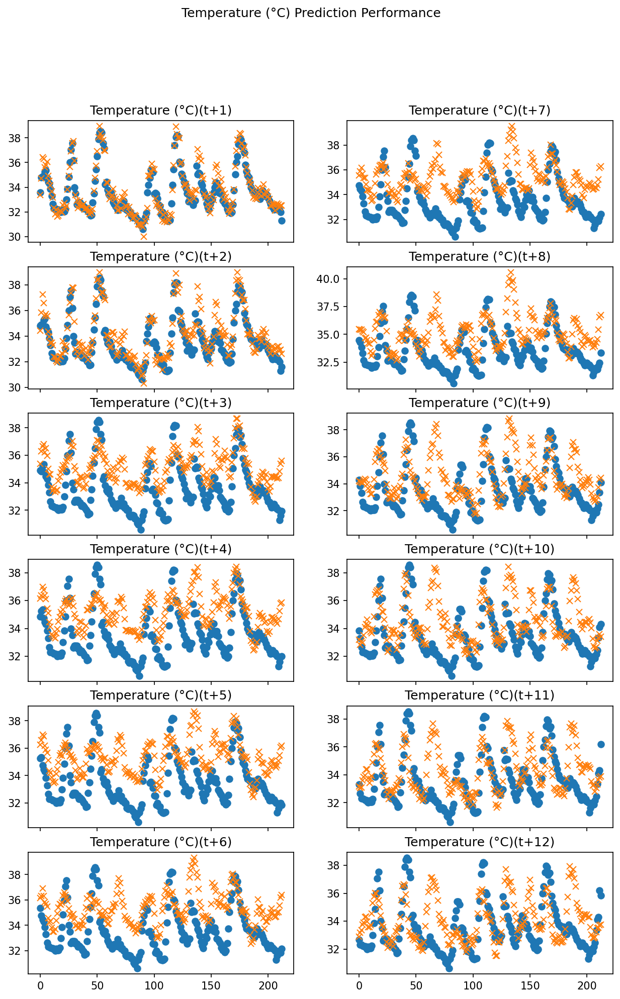

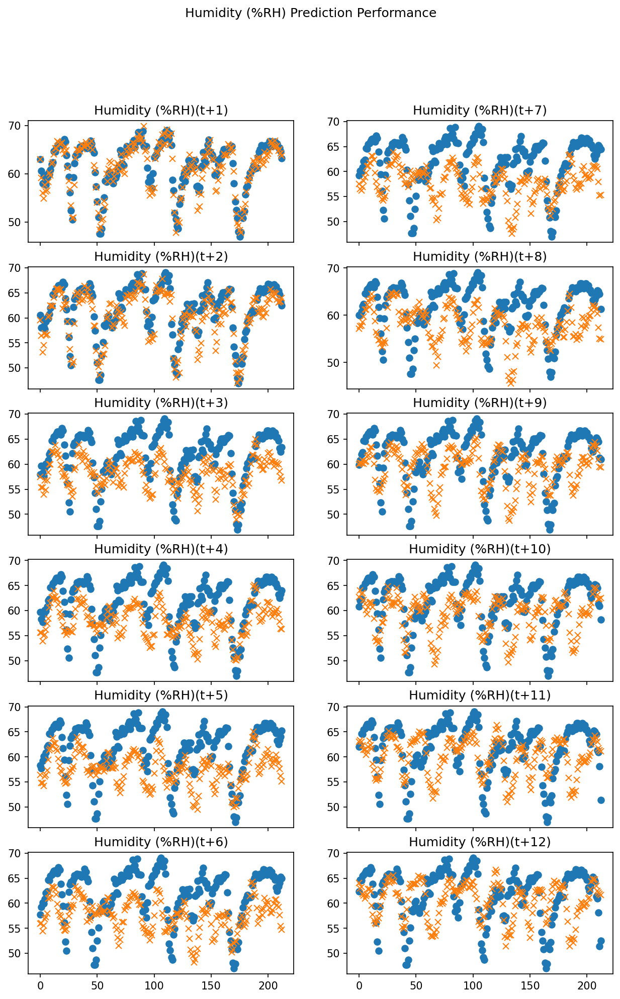

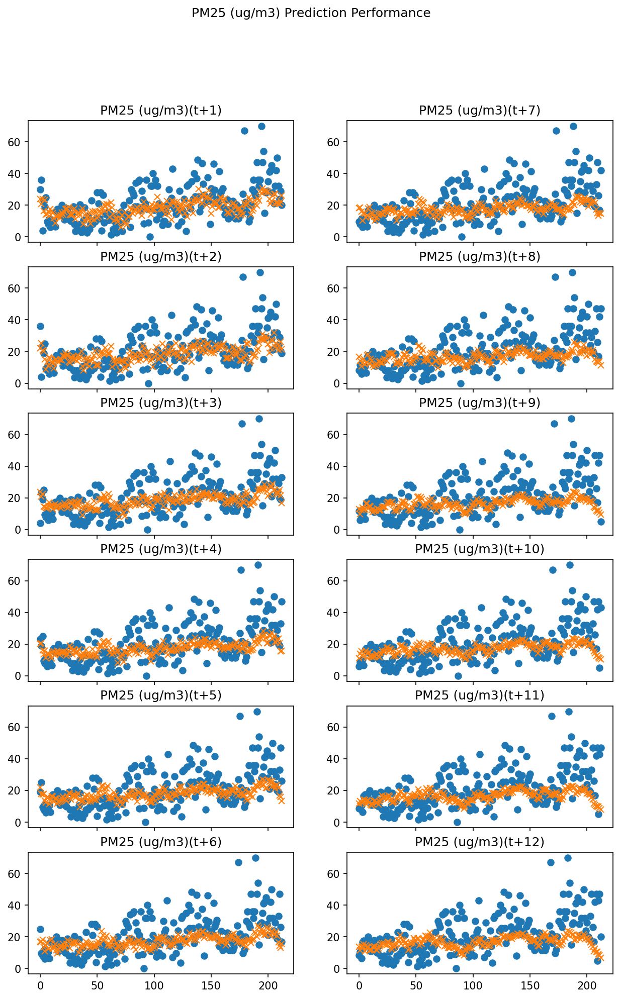

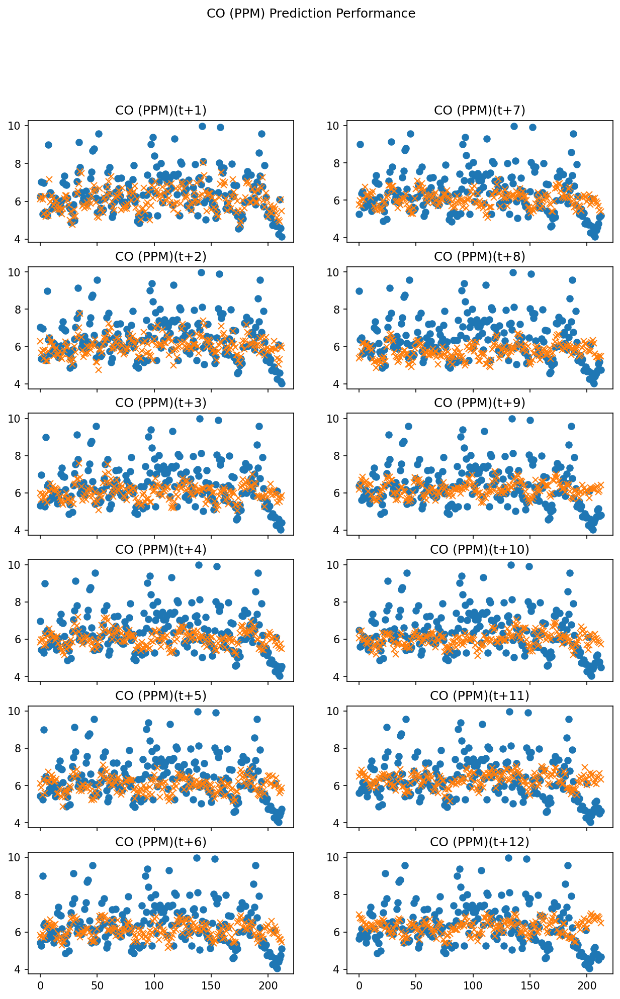

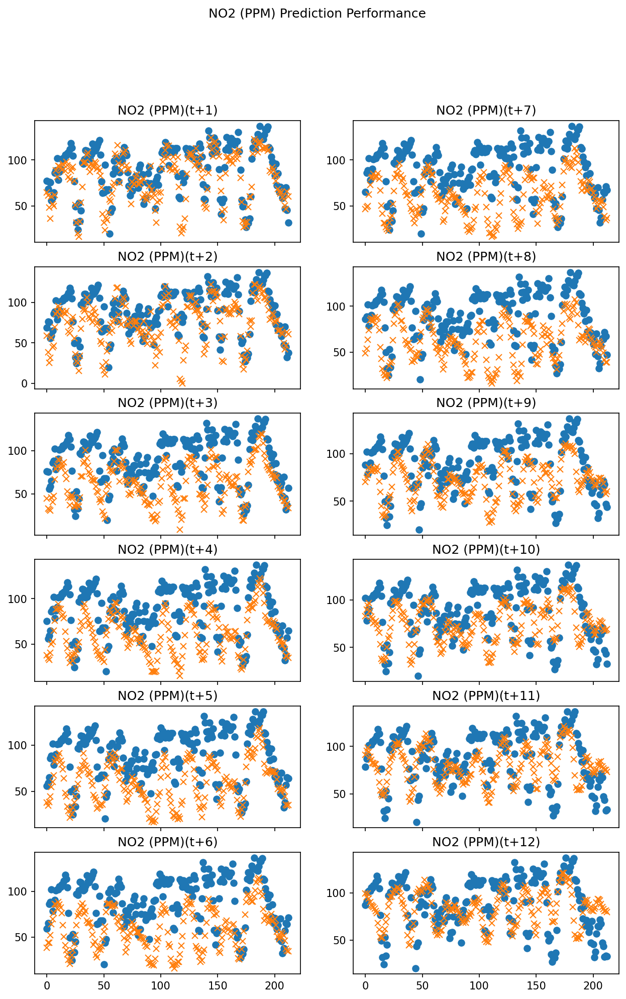

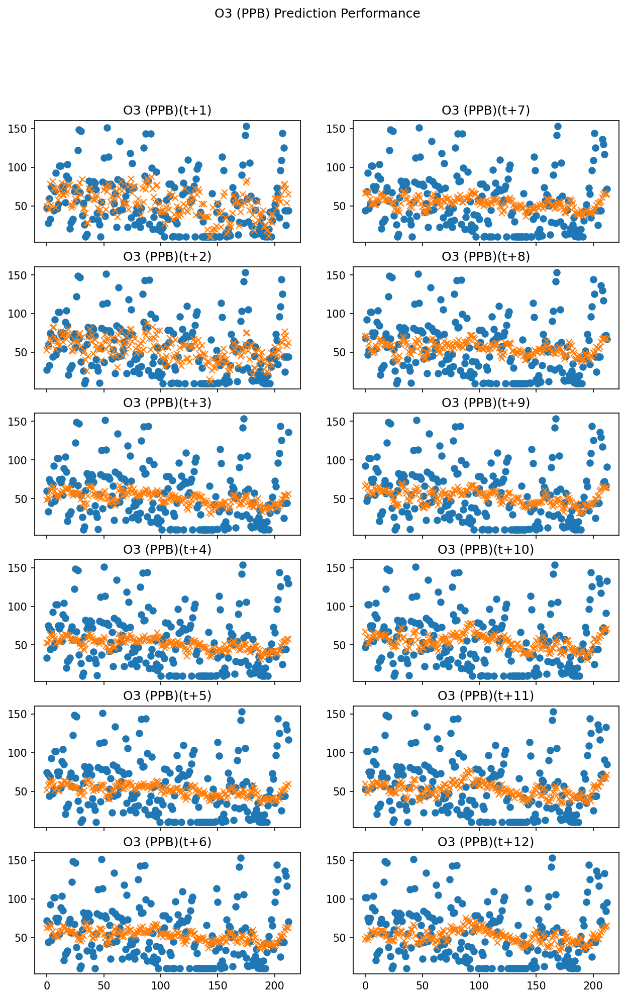

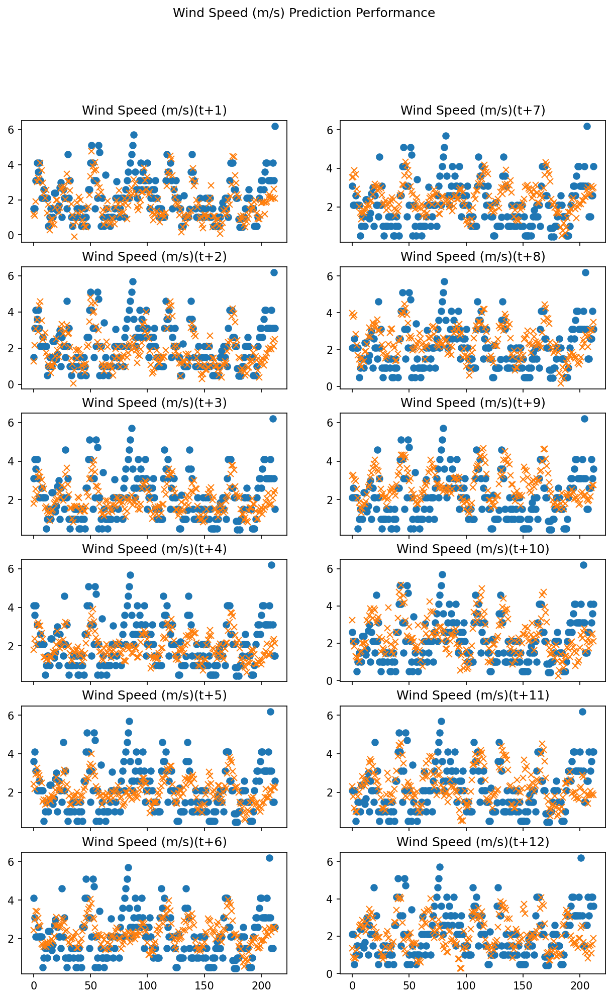

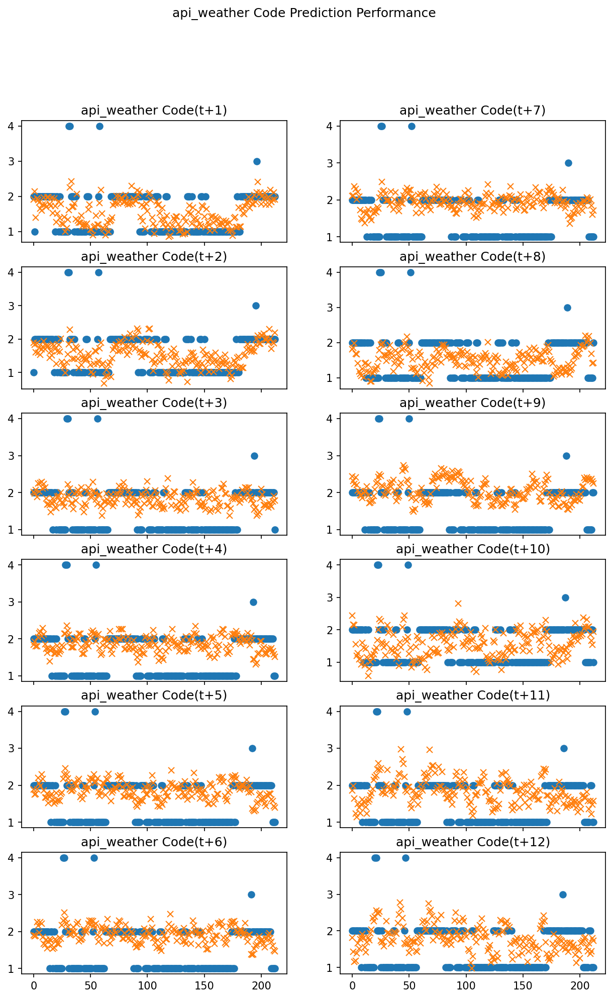

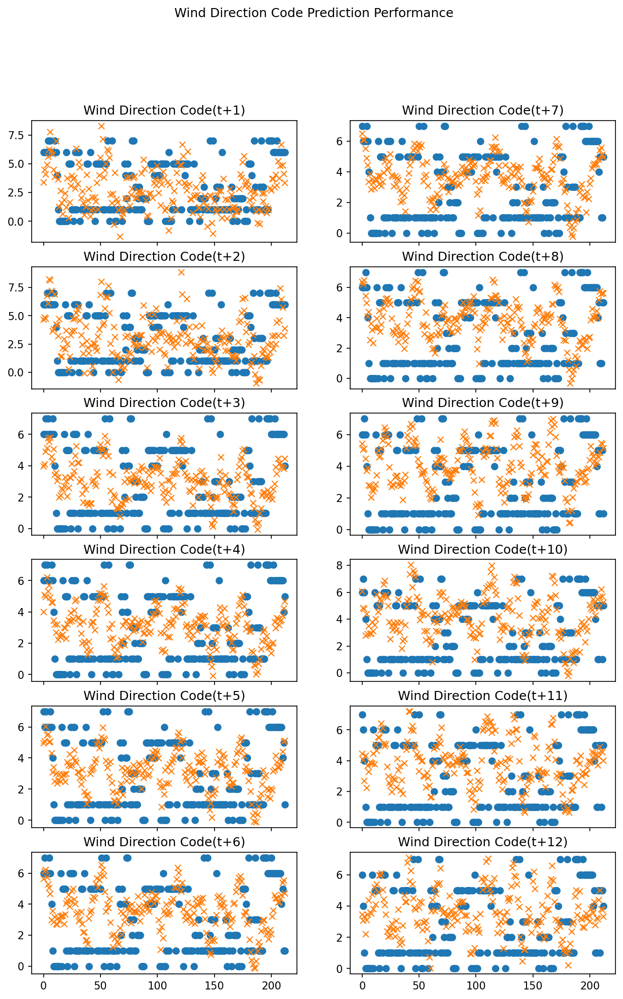

In [258]:
predictor = dsvr_predictor
x_test = x_test_at_time['t+1']
t = np.arange(0, len(x_test))
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0

for label_name in cols:
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0 

### Save the model for later use

In [259]:
import os

In [260]:
root_folder = 'ml_models_ts'
model_name = 'direct_svr'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = dsvr_at_time

In [261]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
for idx, model in enumerate(model_to_dump.values()):
    file_name = '{}_t{}_model.sav'.format(model_name, idx + 1)
    file_path = os.path.join(dir_name, file_name)
    joblib.dump(model, file_path)
    print('Dumped model into file ({})'.format(file_path))
print('done!')

Dumped model into file (ml_models_ts\direct_svr\direct_svr_t1_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t2_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t3_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t4_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t5_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t6_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t7_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t8_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t9_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t10_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t11_model.sav)
Dumped model into file (ml_models_ts\direct_svr\direct_svr_t12_model.sav)
done!


### try to load model

In [126]:
import os

In [127]:
loaded_model = {}
root_folder = 'ml_models_ts'
model_name = 'direct_svr'
dir_name = os.path.join(root_folder, model_name)

In [53]:
for time_idx in range(1, 13, 1):
    file_name = '{}_t{}_model.sav'.format(model_name, time_idx)
    file_path = os.path.join(dir_name, file_name)
    if os.path.exists(file_path):
        loaded_model['t+{}'.format(time_idx)] = joblib.load(file_path)
        print('Loaded model from file {}'.format(file_name))
    else:
        continue
if loaded_model:
    dsvr_at_time = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

Loaded model from file direct_svr_t1_model.sav
Loaded model from file direct_svr_t2_model.sav
Loaded model from file direct_svr_t3_model.sav
Loaded model from file direct_svr_t4_model.sav
Loaded model from file direct_svr_t5_model.sav
Loaded model from file direct_svr_t6_model.sav
Loaded model from file direct_svr_t7_model.sav
Loaded model from file direct_svr_t8_model.sav
Loaded model from file direct_svr_t9_model.sav
Loaded model from file direct_svr_t10_model.sav
Loaded model from file direct_svr_t11_model.sav
Loaded model from file direct_svr_t12_model.sav
done!


## Recurrent Support Vector Regression (R-SVR)
- We use MFs and APCs at (t - 1) + n in predicting the t + n  MFs and APCs
- We use 'rbf' kernel for consistency as in Direct SVR

In [675]:
from sklearn.svm import SVR, SVC
from sklearn.metrics import make_scorer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import RegressorChain

### Model Tuning (GridSearch)

In [676]:
C = [ 1, 10, 100, 1000, 10000 ]
epsilon = [ 0.01, 0.1, 1, 2, 4, 8 ]
gamma = [ float('1e-{}'.format(x)) for x in range(1, 6) ]
gamma.append('scale')
gamma.append('auto')

rsvr_base_name = 'multirsvr__base_estimator'
rsvr_params_grid = {
        '{}__C'.format(rsvr_base_name): C,
        '{}__epsilon'.format(rsvr_base_name): epsilon,
        '{}__gamma'.format(rsvr_base_name): gamma
    }

In [677]:
def get_estimator():
    rsvr_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('powtrans', PowerTransformer()),
            ('multirsvr', RegressorChain(base_estimator=SVR(kernel='rbf')))])
    # determine best parameters using GridSearchCV
    cv_rsvr = GridSearchCV(
        estimator=rsvr_pipe,
        param_grid=rsvr_params_grid,
        cv=5, scoring='neg_root_mean_squared_error', verbose=2, n_jobs=-1)
    return cv_rsvr

In [ ]:
rsvr_at_time = {}
rsvr_best_params_at_time = {}
for time_step, y_train in y_train_at_time.items():
    rsvr = get_estimator()
    cur_x_train = x_train_at_time[time_step]
    # fit models
    print('fitting model for time step ({})...'.format(time_step))
    rsvr.fit(cur_x_train, y_train)
    
    # add models to list
    rsvr_at_time[time_step] = rsvr.best_estimator_
    rsvr_best_params_at_time[time_step] = rsvr.best_params_
    print('done fitting models for time step ({})'.format(time_step))
print('(!!!)done fitting all models!')

fitting model for time step (t+1)...
Fitting 5 folds for each of 210 candidates, totalling 1050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 1050 out of 1050 | elapsed:  2.8min finished


done fitting models for time step (t+1)
fitting model for time step (t+2)...
Fitting 5 folds for each of 210 candidates, totalling 1050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1050 out of 1050 | elapsed:  2.7min finished


done fitting models for time step (t+2)
fitting model for time step (t+3)...
Fitting 5 folds for each of 210 candidates, totalling 1050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   36.8s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1050 out of 1050 | elapsed:  2.7min finished


done fitting models for time step (t+3)
fitting model for time step (t+4)...
Fitting 5 folds for each of 210 candidates, totalling 1050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   15.8s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   36.6s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1050 out of 1050 | elapsed:  2.7min finished


done fitting models for time step (t+4)
fitting model for time step (t+5)...
Fitting 5 folds for each of 210 candidates, totalling 1050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1050 out of 1050 | elapsed:  2.7min finished


done fitting models for time step (t+5)
fitting model for time step (t+6)...
Fitting 5 folds for each of 210 candidates, totalling 1050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1050 out of 1050 | elapsed:  2.7min finished


done fitting models for time step (t+6)
fitting model for time step (t+7)...
Fitting 5 folds for each of 210 candidates, totalling 1050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    3.4s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   16.1s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   37.0s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 1050 out of 1050 | elapsed:  2.7min finished


done fitting models for time step (t+7)
fitting model for time step (t+8)...
Fitting 5 folds for each of 210 candidates, totalling 1050 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:   37.4s
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 989 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done 1050 out of 1050 | elapsed:  2.8min finished


In [679]:
# build predictor
rsvr_predictor = Predictor('recurrent', rsvr_at_time)

In [680]:
# see best parameters
for time_step, best_params in rsvr_best_params_at_time.items():
    print('{} : {}'.format(time_step, best_params))

t+1 : {'multirsvr__base_estimator__C': 10000, 'multirsvr__base_estimator__epsilon': 0.1, 'multirsvr__base_estimator__gamma': 1e-05}
t+2 : {'multirsvr__base_estimator__C': 10000, 'multirsvr__base_estimator__epsilon': 0.1, 'multirsvr__base_estimator__gamma': 1e-05}
t+3 : {'multirsvr__base_estimator__C': 10000, 'multirsvr__base_estimator__epsilon': 0.1, 'multirsvr__base_estimator__gamma': 0.0001}
t+4 : {'multirsvr__base_estimator__C': 10000, 'multirsvr__base_estimator__epsilon': 0.1, 'multirsvr__base_estimator__gamma': 0.0001}
t+5 : {'multirsvr__base_estimator__C': 10000, 'multirsvr__base_estimator__epsilon': 0.1, 'multirsvr__base_estimator__gamma': 0.0001}
t+6 : {'multirsvr__base_estimator__C': 10000, 'multirsvr__base_estimator__epsilon': 0.01, 'multirsvr__base_estimator__gamma': 0.0001}
t+7 : {'multirsvr__base_estimator__C': 10000, 'multirsvr__base_estimator__epsilon': 0.1, 'multirsvr__base_estimator__gamma': 0.0001}
t+8 : {'multirsvr__base_estimator__C': 10000, 'multirsvr__base_estimat

### RMSE

In [681]:
predictor = rsvr_predictor
invalid_cols = ['date', 'api_weather Code', 'Wind Direction Code']
cols = [val for val in dataset.columns.values if val not in invalid_cols]
x_test = x_test_at_time['t+1']
target_idx = 0
for label_name in cols:
    print('RMSE for {}'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for Temperature (°C)
Model(t+1): 0.6528544332593428


ValueError: X has 115 features, but this StandardScaler is expecting 117 features as input.

### PLCC

In [ ]:
predictor = rsvr_predictor
invalid_cols = ['date', 'api_weather Code', 'Wind Direction Code']
cols = [val for val in dataset.columns.values if val not in invalid_cols]
x_test = x_test_at_time['t+1']
target_idx = 0
for label_name in cols:
    print('PLCC for {}'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Plot the performance of the model

In [ ]:
predictor = rsvr_predictor
invalid_cols = ['date', 'api_weather Code', 'Wind Direction Code']
cols = [val for val in dataset.columns.values if val not in invalid_cols]
x_test = x_test_at_time['t+1']
t = np.arange(0, len(x_test))
target_idx = 0
for label_name in cols:
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [380]:
import os

In [381]:
root_folder = 'ml_models_ts'
model_name = 'rsvr'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = rsvr_at_time

In [382]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
for idx, model in enumerate(model_to_dump.values()):
    file_name = '{}_t{}_model.sav'.format(model_name, idx + 1)
    file_path = os.path.join(dir_name, file_name)
    joblib.dump(model, file_path)
    print('Dumped model into file ({})'.format(file_path))
print('done!')

Dumped model into file (ml_models_ts\rsvr\rsvr_t1_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t2_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t3_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t4_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t5_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t6_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t7_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t8_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t9_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t10_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t11_model.sav)
Dumped model into file (ml_models_ts\rsvr\rsvr_t12_model.sav)
done!


### try to load model

In [60]:
import os

In [61]:
loaded_model = {}
root_folder = 'ml_models_ts'
model_name = 'rsvr'
dir_name = os.path.join(root_folder, model_name)

In [62]:
for time_idx in range(1, 13, 1):
    file_name = '{}_t{}_model.sav'.format(model_name, time_idx)
    file_path = os.path.join(dir_name, file_name)
    if os.path.exists(file_path):
        loaded_model['t+{}'.format(time_idx)] = joblib.load(file_path)
        print('Loaded model from file {}'.format(file_name))
    else:
        continue
if loaded_model:
    rsvr_at_time = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

Loaded model from file rsvr_t1_model.sav
Loaded model from file rsvr_t2_model.sav
Loaded model from file rsvr_t3_model.sav
Loaded model from file rsvr_t4_model.sav
Loaded model from file rsvr_t5_model.sav
Loaded model from file rsvr_t6_model.sav
Loaded model from file rsvr_t7_model.sav
Loaded model from file rsvr_t8_model.sav
Loaded model from file rsvr_t9_model.sav
Loaded model from file rsvr_t10_model.sav
Loaded model from file rsvr_t11_model.sav
Loaded model from file rsvr_t12_model.sav
done!


## Random Forest
Advantage of RF is that it supports multi-output regression without any configs required

In [383]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

### Model Tuning (Randomized)

In [ ]:
# Parameters for model tuning
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 4, 16]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
def get_estimator():
    rf_estimator = RandomForestRegressor()
    # random search best parameters using RandomizedSearchCV
    rf_random = RandomizedSearchCV(estimator = rf_estimator,
                                   param_distributions = random_grid, 
                                   n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
    return rf_random

In [ ]:
# test using random search
rf_at_time = {}
for time_step, xy_train in xy_train_at_time.items():
    rf_optimizer = get_estimator()
    x_train = None
    if time_step == 't+1':
        x_train = x_train_pres
    else:
        prev_time = int(time_step.split('+')[1]) - 1
        prev_time_step = 't+{}'.format(prev_time)
        x_train = xy_train_at_time[prev_time_step]
    y_train = xy_train
    print('fitting model for time step ({})...'.format(time_step)) 
    rf_optimizer.fit(x_train, y_train)
    rf_at_time[time_step] = rf_optimizer
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting all models!')

In [ ]:
# see best parameters
for time_step, optimizer in rf_at_time.items():
    print('{} : {}'.format(time_step, optimizer.best_params_))

### Model Tuning (GridSearch, reduced parameters after doing randomized tuning)

In [406]:
# narrowed down parameters for gridsearch based on RandomSearchCv results
n_estimators = [int(x) for x in np.linspace(start = 800, stop = 2000, num = 10)]
max_features = ['sqrt', 'log2']
max_depth = [int(x) for x in np.linspace(90, 160, num = 8)]

# Create the random grid
gs_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth}

In [407]:
def get_estimator():
    rf_estimator = RandomForestRegressor(min_samples_split = 2, min_samples_leaf = 1, 
                                        bootstrap = True)
    # random search best parameters using RandomizedSearchCV
    rf_gs = GridSearchCV(estimator=rf_estimator, param_grid=gs_grid, scoring='neg_root_mean_squared_error',
                          cv=5, n_jobs=-1, verbose=2)
    return rf_gs

In [408]:
rf_at_time = {}
rf_best_params_at_time = {}
for time_step, y_train in y_train_at_time.items():
    rf_optimizer = get_estimator()
    x_train = x_train_at_time[time_step]
    print('fitting model for time step ({})...'.format(time_step)) 
    rf_optimizer.fit(x_train, y_train)
    rf_at_time[time_step] = rf_optimizer.best_estimator_
    rf_best_params_at_time[time_step] = rf_optimizer.best_params_
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting all models!')

fitting model for time step (t+1)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   20.6s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.3min finished


done fitting model for time step (t+1)
fitting model for time step (t+2)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.2min finished


done fitting model for time step (t+2)
fitting model for time step (t+3)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.2min finished


done fitting model for time step (t+3)
fitting model for time step (t+4)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.2min finished


done fitting model for time step (t+4)
fitting model for time step (t+5)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.2min finished


done fitting model for time step (t+5)
fitting model for time step (t+6)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.3s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.2min finished


done fitting model for time step (t+6)
fitting model for time step (t+7)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.2min finished


done fitting model for time step (t+7)
fitting model for time step (t+8)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.2min finished


done fitting model for time step (t+8)
fitting model for time step (t+9)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.0s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.3min finished


done fitting model for time step (t+9)
fitting model for time step (t+10)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.2s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.4min finished


done fitting model for time step (t+10)
fitting model for time step (t+11)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.5s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  4.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.3min finished


done fitting model for time step (t+11)
fitting model for time step (t+12)...
Fitting 5 folds for each of 160 candidates, totalling 800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:   16.7s
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 341 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 800 out of 800 | elapsed: 11.4min finished


done fitting model for time step (t+12)
done fitting all models!


In [409]:
# see best parameters
for time_step, best_params in rf_best_params_at_time.items():
    print('{} : {}'.format(time_step, best_params))

t+1 : {'max_depth': 140, 'max_features': 'sqrt', 'n_estimators': 933}
t+2 : {'max_depth': 160, 'max_features': 'sqrt', 'n_estimators': 1733}
t+3 : {'max_depth': 90, 'max_features': 'sqrt', 'n_estimators': 1066}
t+4 : {'max_depth': 160, 'max_features': 'sqrt', 'n_estimators': 1066}
t+5 : {'max_depth': 120, 'max_features': 'sqrt', 'n_estimators': 1733}
t+6 : {'max_depth': 140, 'max_features': 'sqrt', 'n_estimators': 1733}
t+7 : {'max_depth': 130, 'max_features': 'sqrt', 'n_estimators': 2000}
t+8 : {'max_depth': 120, 'max_features': 'sqrt', 'n_estimators': 2000}
t+9 : {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 2000}
t+10 : {'max_depth': 140, 'max_features': 'sqrt', 'n_estimators': 800}
t+11 : {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 2000}
t+12 : {'max_depth': 130, 'max_features': 'sqrt', 'n_estimators': 1200}


In [410]:
# build predictor
rf_predictor = Predictor('recurrent', rf_at_time)

### RMSE

In [411]:
predictor = rf_predictor
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    print('RMSE for {}'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time['t+1']
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for Temperature (°C)
Model(t+1): 1.771306556981216
Model(t+2): 2.1894438591091383
Model(t+3): 2.7075823930991416
Model(t+4): 3.183317522475768
Model(t+5): 3.5730781507970137
Model(t+6): 3.833337302060931
Model(t+7): 3.9281468372456634
Model(t+8): 3.910658415953287
Model(t+9): 3.72660057260579
Model(t+10): 3.413407923807981
Model(t+11): 3.0166258775223778
Model(t+12): 2.7141279193541177
RMSE for Humidity (%RH)
Model(t+1): 4.489010564978965
Model(t+2): 5.538112283812616
Model(t+3): 6.870913347506598
Model(t+4): 8.059546140352813
Model(t+5): 9.051142069788247
Model(t+6): 9.694787167314068
Model(t+7): 9.928451287164414
Model(t+8): 9.854891966267026
Model(t+9): 9.351442518424031
Model(t+10): 8.537772055103726
Model(t+11): 7.637159537656438
Model(t+12): 6.973355307224494
RMSE for PM25 (ug/m3)
Model(t+1): 11.902365974753664
Model(t+2): 12.003904851532418
Model(t+3): 12.126313576259424
Model(t+4): 12.394391760121051
Model(t+5): 12.420890815434774
Model(t+6): 12.471251690883829
Model(t+7):

### PLCC

In [412]:
predictor = rf_predictor
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    print('PLCC for {}'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time['t+1']
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for Temperature (°C)
Model(t+1): (0.8454933182388427, 2.09010155414417e-59)
Model(t+2): (0.7198699248604374, 2.63871817281034e-35)
Model(t+3): (0.5397406917599786, 1.6778944416830922e-17)
Model(t+4): (0.3688566991707426, 2.8812959136917855e-08)
Model(t+5): (0.2550189063185399, 0.00016830708837926677)
Model(t+6): (0.17985673092783325, 0.008514254969458726)
Model(t+7): (0.15145582856778625, 0.02709242532132682)
Model(t+8): (0.15226819153564605, 0.026271270027705927)
Model(t+9): (0.16929742861907676, 0.013354943613336123)
Model(t+10): (0.20883203046021986, 0.0021860358515250135)
Model(t+11): (0.2157036504867175, 0.0015405653172576742)
Model(t+12): (0.1937981726726299, 0.004529627767073564)
PLCC for Humidity (%RH)
Model(t+1): (0.7988072588553133, 1.852125609252152e-48)
Model(t+2): (0.6515271378624572, 4.0588034315773674e-27)
Model(t+3): (0.4355607522113317, 2.8399661929490985e-11)
Model(t+4): (0.26117532573187047, 0.00011504659880720792)
Model(t+5): (0.1436935704565517, 0.036110044424

### Plot the performance of the model

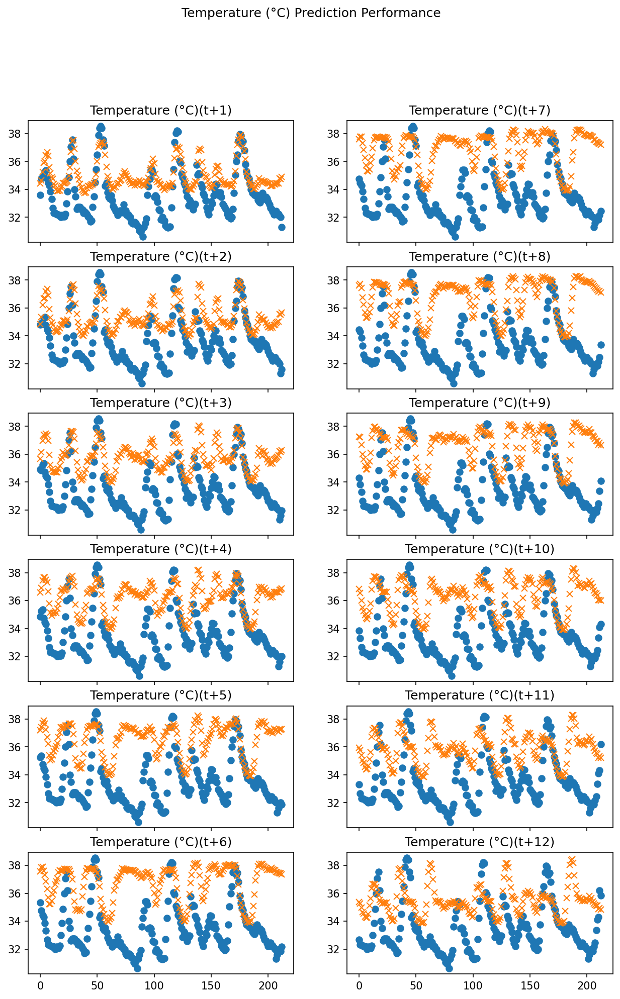

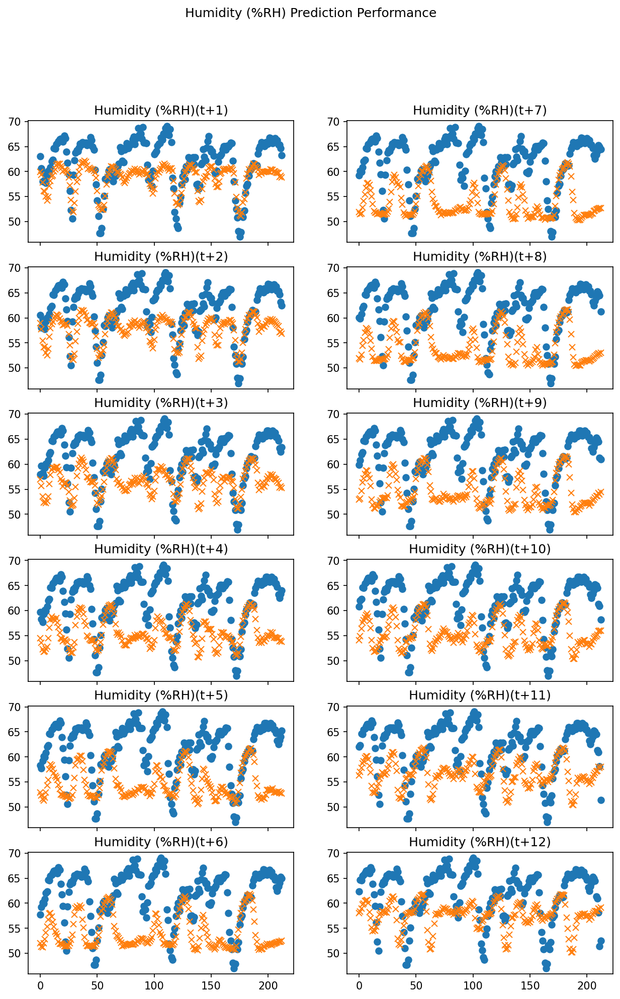

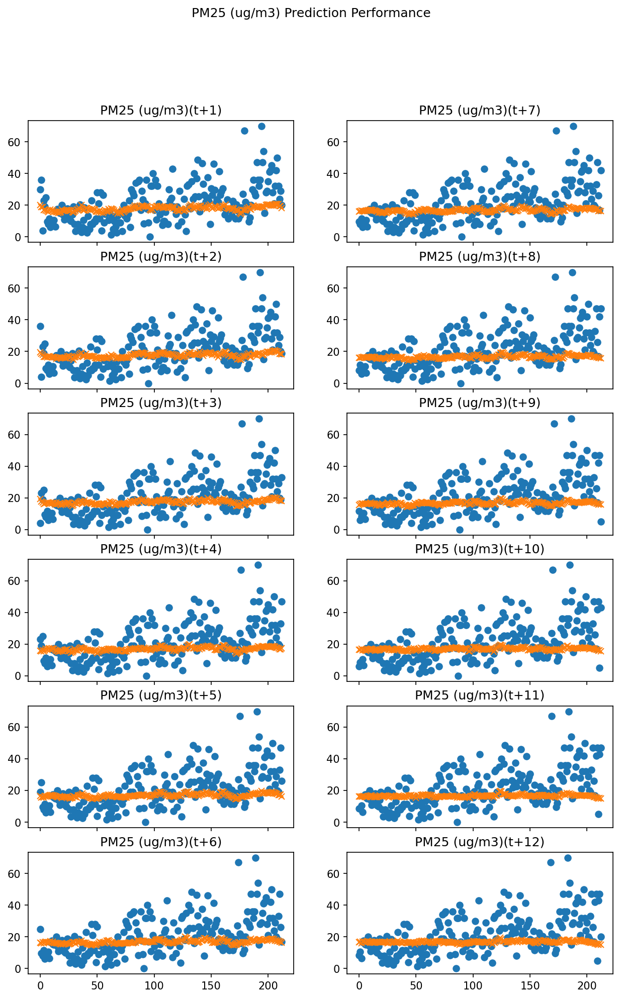

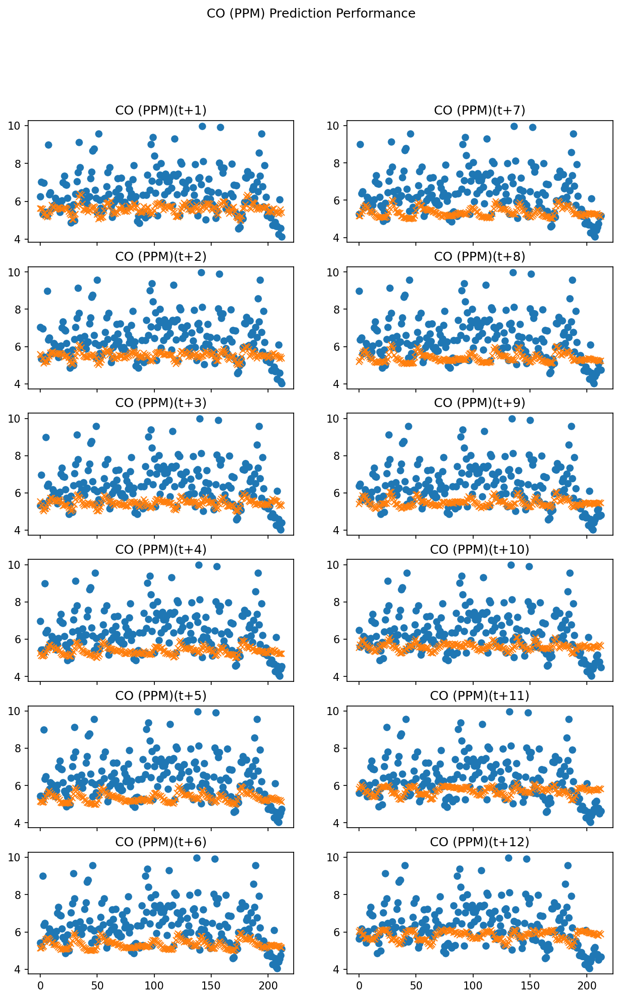

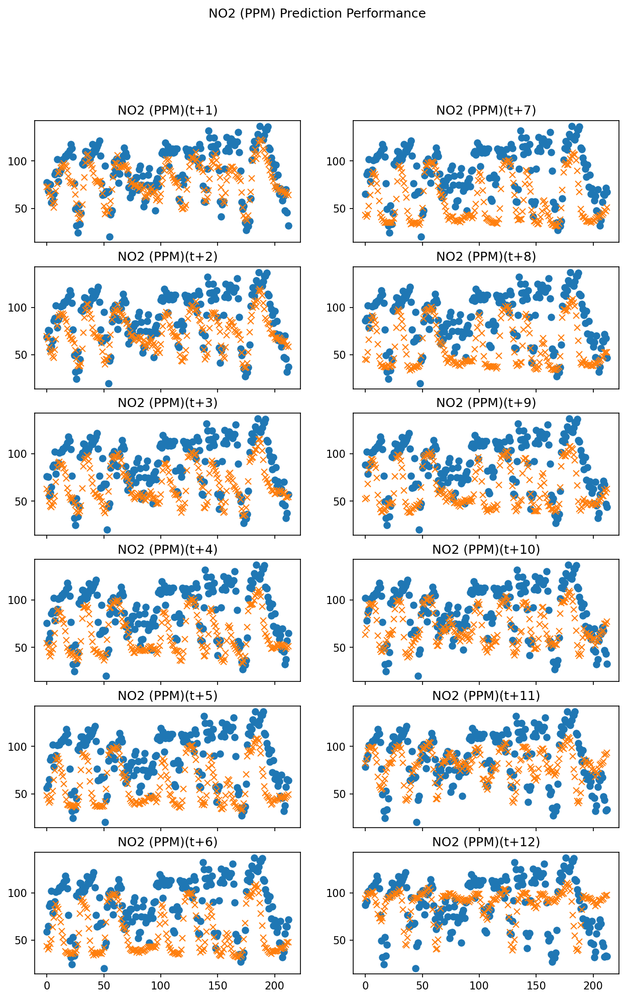

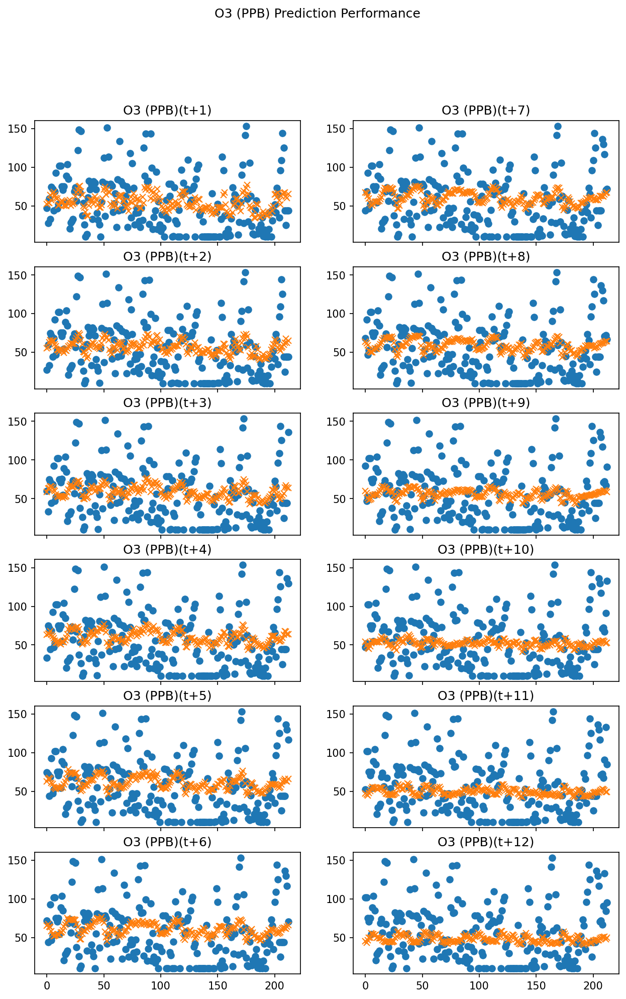

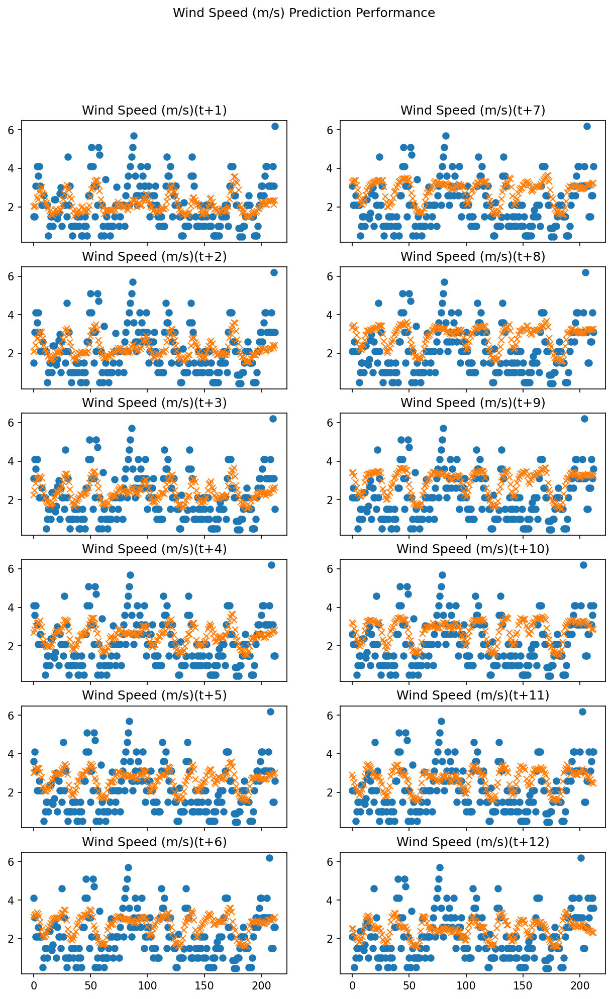

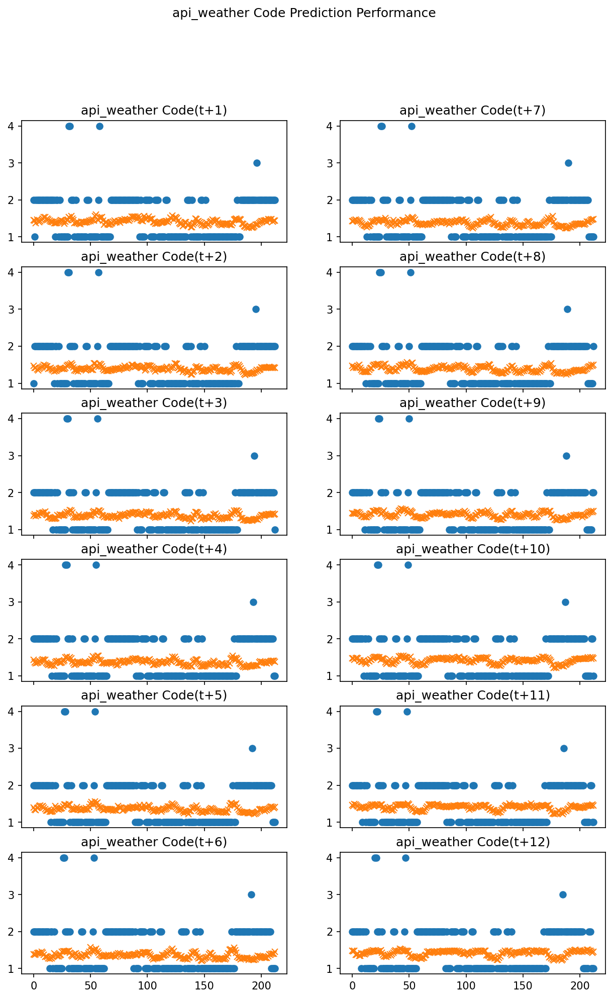

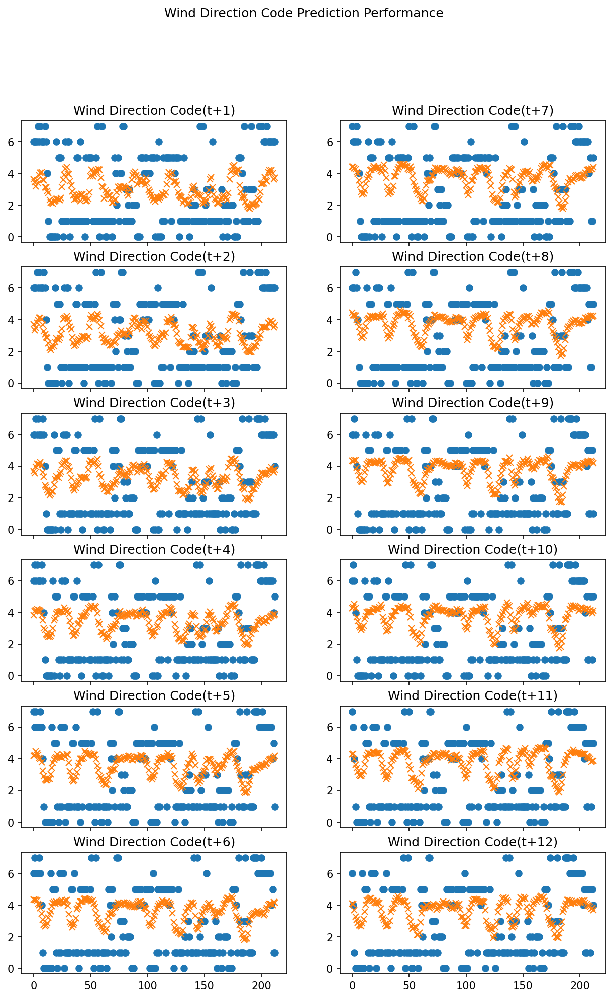

In [414]:
predictor = rf_predictor
t = np.arange(0, len(x_test_at_time['t+1']))
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time['t+1']
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [ ]:
import os

In [ ]:
root_folder = 'ml_models_ts'
model_name = 'random_forest'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = rf_at_time

In [ ]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
for idx, model in enumerate(model_to_dump.values()):
    file_name = '{}_t{}_model.sav'.format(model_name, idx + 1)
    file_path = os.path.join(dir_name, file_name)
    joblib.dump(model, file_path)
    print('Dumped model into file ({})'.format(file_path))
print('done!')

### try to load model

In [ ]:
import os

In [ ]:
loaded_model = {}
root_folder = 'ml_models'
model_name = 'random_forest'
dir_name = os.path.join(root_folder, model_name)

In [ ]:
for time_idx in range(1, 13, 1):
    file_name = '{}_t{}_model.sav'.format(model_name, time_idx)
    file_path = os.path.join(dir_name, file_name)
    if os.path.exists(file_path):
        loaded_model['t+{}'.format(time_idx)] = joblib.load(file_path)
        print('Loaded model from file {}'.format(file_name))
    else:
        continue
if loaded_model:
    rf_at_time = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

## Stochastic Gradient Boosting (SGD Trees)

In [415]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler, PowerTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.multioutput import RegressorChain

### Model Tuning (Randomized)

In [416]:
# loss function to use
loss = [ 'ls', 'lad', 'huber' ]
# learning rate shrinks the contribution of each tree
learning_rate = [ 0.1, 0.15, 0.2 ]
# the number of boosting stages to perform.
n_estimators = [ int(x) for x in np.linspace(start = 100, stop = 2000, num = 20) ]
# The fraction of samples to be used for fitting the individual base learners
subsample = [ 0.2, 0.4, 0.8, 0.9 ]
# The minimum number of samples required to split an internal node
min_samples_split = [ 2, 4, 8, 16 ]
# The minimum number of samples required to be at a leaf node
min_samples_leaf = [ 1, 2, 4, 8 ]
# maximum depth of the individual regression estimators.
max_depth = [ int(x) for x in np.linspace(start = 3, stop = 30, num = 10) ]
# The number of features to consider when looking for the best split:
max_features = [ 'auto', 'sqrt', 'log2' ]

# Create the grid
estimator_name = 'sgb__base_estimator'
sgb_grid = {'{}__loss'.format(estimator_name): loss,
              '{}__learning_rate'.format(estimator_name): learning_rate,
               '{}__n_estimators'.format(estimator_name): n_estimators,
               '{}__subsample'.format(estimator_name): subsample,
               '{}__min_samples_split'.format(estimator_name): min_samples_split,
               '{}__min_samples_leaf'.format(estimator_name): min_samples_leaf,
               '{}__max_depth'.format(estimator_name): max_depth,
               '{}__max_features'.format(estimator_name): max_features
              }

In [417]:
def get_estimator():
    sgb_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('powtrans', PowerTransformer()),
            ('sgb', RegressorChain(base_estimator=GradientBoostingRegressor()))])
    sgb_optimizer = RandomizedSearchCV(estimator = sgb_pipe,
                                   param_distributions = sgb_grid, scoring='neg_root_mean_squared_error',
                                   n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = -1)
    return sgb_optimizer

In [418]:
sgb_at_time = {}
sgb_best_params_at_time = {}
for time_step, y_train in y_train_at_time.items():
    sgb_optimizer = get_estimator()
    x_train = x_train_at_time[time_step]
    print('fitting model for time step ({})...'.format(time_step)) 
    sgb_optimizer.fit(x_train, y_train)
    sgb_at_time[time_step] = sgb_optimizer.best_estimator_
    sgb_best_params_at_time[time_step] = sgb_optimizer.best_params_
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting all models!')

fitting model for time step (t+1)...
Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed: 28.0min


KeyboardInterrupt: 

In [ ]:
#see best params
for time_step, best_params in sgb_best_params_at_time.items():
    print('{} : {}'.format(time_step, best_params))

In [ ]:
# build predictor
sgb_predictor = Predictor('recurrent', sgb_at_time)

### Model Tuning (GridSearch, reduced parameters after doing randomized tuning)

In [395]:
loss = [ 'ls', 'lad', 'huber' ]
learning_rate = [ 0.1 ]
n_estimators = [ int(x) for x in np.linspace(start = 700, stop = 1900, num = 10) ]
subsample = [ 0.5, 0.8, 0.9 ]
min_samples_split = [ 2, 4, 8 ]
min_samples_leaf = [ 1, 2, 4, 8 ]
max_depth = [ int(x) for x in np.linspace(start = 5, stop = 50, num = 10) ]
max_features = [ 'auto', 'sqrt', 'log2' ]

estimator_name = 'sgb__base_estimator'
sgb_grid = {'{}__loss'.format(estimator_name): loss,
              '{}__learning_rate'.format(estimator_name): learning_rate,
               '{}__n_estimators'.format(estimator_name): n_estimators,
               '{}__subsample'.format(estimator_name): subsample,
               '{}__min_samples_split'.format(estimator_name): min_samples_split,
               '{}__min_samples_leaf'.format(estimator_name): min_samples_leaf,
               '{}__max_depth'.format(estimator_name): max_depth,
               '{}__max_features'.format(estimator_name): max_features
              }

In [397]:
def get_estimator():
    sgb_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('powtrans', PowerTransformer()),
            ('sgb', RegressorChain(base_estimator=GradientBoostingRegressor()))])
    cv_sgb = GridSearchCV(
        estimator=sgb_pipe,
        param_grid=sgb_grid,
        cv=5, scoring='neg_root_mean_squared_error', verbose=2, n_jobs=-1)
    return cv_sgb

In [398]:
sgb_at_time = {}
sgb_best_params_at_time = {}
for time_step, y_train in y_train_at_time.items():
    sgb_optimizer = get_estimator()
    x_train = x_train_at_time[time_step]
    print('fitting model for time step ({})...'.format(time_step)) 
    sgb_optimizer.fit(x_train, y_train)
    sgb_at_time[time_step] = sgb_optimizer.best_estimator_
    sgb_best_params_at_time[time_step] = sgb_optimizer.best_params_
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting all models!')

fitting model for time step (t+1)...
Fitting 5 folds for each of 32400 candidates, totalling 162000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.


KeyboardInterrupt: 

In [ ]:
#see best params
for time_step, best_params in sgb_best_params_at_time.items():
    print('{} : {}'.format(time_step, best_params))

In [ ]:
# build predictor
sgb_predictor = Predictor('recurrent', sgb_at_time)

### RMSE

In [ ]:
predictor = sgb_predictor
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    print('RMSE for {}'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time['t+1']
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### PLCC

In [ ]:
predictor = sgb_predictor
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    print('PLCC for {}'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time['t+1']
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Plot the performance of the model

In [ ]:
predictor = sgb_predictor
t = np.arange(0, len(x_test_at_time['t+1']))
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time['t+1']
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [ ]:
import os

In [ ]:
root_folder = 'ml_models_ts'
model_name = 'sgb'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = sgb_at_time

In [ ]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
for idx, model in enumerate(model_to_dump.values()):
    file_name = '{}_t{}_model.sav'.format(model_name, idx + 1)
    file_path = os.path.join(dir_name, file_name)
    joblib.dump(model, file_path)
    print('Dumped model into file ({})'.format(file_path))
print('done!')

### try to load model

In [ ]:
import os

In [ ]:
loaded_model = {}
root_folder = 'ml_models'
model_name = 'sgb'
dir_name = os.path.join(root_folder, model_name)

In [ ]:
for time_idx in range(1, 13, 1):
    file_name = '{}_t{}_model.sav'.format(model_name, time_idx)
    file_path = os.path.join(dir_name, file_name)
    if os.path.exists(file_path):
        loaded_model['t+{}'.format(time_idx)] = joblib.load(file_path)
        print('Loaded model from file {}'.format(file_name))
    else:
        continue
if loaded_model:
    sgb_at_time = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

## Nearest Neighbors Regression

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

### Model Tuning (GridSearch)

In [ ]:
n_neighbors = [ int(x) for x in np.linspace( 2, 16, 9) ]
weights = [ 'uniform', 'distance' ]
algorithm = [ 'auto', 'ball_tree', 'kd_tree', 'brute' ]

nbr_params_grid = {
    'nbr__n_neighbors': n_neighbors,
    'nbr__weights': weights,
    'nbr__algorithm': algorithm
}

In [ ]:
def get_estimator():
    nbr_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('nbr', KNeighborsRegressor())])
    # determine best parameters using GridSearchCV
    cv_nbr = GridSearchCV(
        estimator=nbr_pipe,
        param_grid=nbr_params_grid,
        cv=5, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
    return cv_nbr

In [ ]:
nbr_at_time = {}
for time_step, xy_train in xy_train_at_time.items():
    nbr_optimizer = get_estimator()
    x_train = None
    if time_step == 't+1':
        x_train = x_train_pres
    else:
        prev_time = int(time_step.split('+')[1]) - 1
        prev_time_step = 't+{}'.format(prev_time)
        x_train = xy_train_at_time[prev_time_step]
    y_train = xy_train
    print('fitting model for time step ({})...'.format(time_step)) 
    nbr_optimizer.fit(x_train, y_train)
    nbr_at_time[time_step] = nbr_optimizer
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting all models!')

### Get best parameters

In [ ]:
nbr_best_params_at_time = {}
# see best parameters
for time_step, optimizer in nbr_at_time.items():
    nbr_best_params_at_time[time_step] = optimizer.best_params_
    print('{} : {}'.format(time_step, optimizer.best_params_))

### Build and train final model with best parameters

In [ ]:
nbr_at_time = {}
for time_step, xy_train in xy_train_at_time.items():
    nbr_pipe = Pipeline([
            ('scaler', StandardScaler()),
            ('nbr', KNeighborsRegressor())])
    nbr_pipe.set_params(**nbr_best_params_at_time[time_step])
    x_train = None
    if time_step == 't+1':
        x_train = x_train_pres
    else:
        prev_time = int(time_step.split('+')[1]) - 1
        prev_time_step = 't+{}'.format(prev_time)
        x_train = xy_train_at_time[prev_time_step]
    y_train = xy_train
    print('fitting model for time step ({})...'.format(time_step)) 
    nbr_pipe.fit(x_train, y_train)
    nbr_at_time[time_step] = nbr_pipe
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting all models!')

In [ ]:
# build predictor
predictor = Predictor('recurrent', nbr_at_time)

### RMSE

In [ ]:
cols = [val for val in dataset.columns.values if val != 'date']
x_test = x_test_pres
target_idx = 0
for label_name in cols:
    print('RMSE for {}'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = xy_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### PLCC

In [ ]:
cols = [val for val in dataset.columns.values if val != 'date']
x_test = x_test_pres
target_idx = 0
for label_name in cols:
    print('PLCC for {}'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = xy_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Plot the performance of the model

In [ ]:
t = np.arange(0, len(x_test))
cols = [val for val in dataset.columns.values if val != 'date']
x_test = x_test_pres
target_idx = 0
for label_name in cols:
    x_test = x_test_pres
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step in predictor.predictors:
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = xy_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [ ]:
import os

In [ ]:
root_folder = 'ml_models'
model_name = 'nbr'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = nbr_at_time

In [ ]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
for idx, model in enumerate(model_to_dump.values()):
    file_name = '{}_t{}_model.sav'.format(model_name, idx + 1)
    file_path = os.path.join(dir_name, file_name)
    joblib.dump(model, file_path)
    print('Dumped model into file ({})'.format(file_path))
print('done!')

### try to load model

In [ ]:
import os

In [ ]:
loaded_model = {}
root_folder = 'ml_models'
model_name = 'nbr'
dir_name = os.path.join(root_folder, model_name)

In [ ]:
for time_idx in range(1, 13, 1):
    file_name = '{}_t{}_model.sav'.format(model_name, time_idx)
    file_path = os.path.join(dir_name, file_name)
    if os.path.exists(file_path):
        loaded_model['t+{}'.format(time_idx)] = joblib.load(file_path)
        print('Loaded model from file {}'.format(file_name))
    else:
        continue
if loaded_model:
    nbr_at_time = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

## Ensemble (5 Regressors)
Consists of 5 regressors:
- SVR
- R-SVR
- Random Forest
- SGD
- Nearest Neighbors

We take the mean of the predicted values of each regressor to get the final model's predicted value.

In [314]:
# learner models
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
# final meta estimator
from sklearn.kernel_ridge import KernelRidge
# others
from mlxtend.regressor import StackingRegressor
from sklearn.multioutput import RegressorChain
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, PowerTransformer

### Best parameters

In [345]:
svr_best_params = {
    't+1' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+2' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+3' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+4' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+5' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+6' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+7' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+8' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+9' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+10' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+11' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001},
    't+12' : {'C': 1000, 'epsilon': 0.5, 'gamma': 0.0001}
}

In [316]:
rf_best_params = {
    't+1' : {'max_depth': 140, 'max_features': 'sqrt', 'n_estimators': 933},
    't+2' : {'max_depth': 160, 'max_features': 'sqrt', 'n_estimators': 1733},
    't+3' : {'max_depth': 90, 'max_features': 'sqrt', 'n_estimators': 1066},
    't+4' : {'max_depth': 160, 'max_features': 'sqrt', 'n_estimators': 1066},
    't+5' : {'max_depth': 120, 'max_features': 'sqrt', 'n_estimators': 1733},
    't+6' : {'max_depth': 140, 'max_features': 'sqrt', 'n_estimators': 1733},
    't+7' : {'max_depth': 130, 'max_features': 'sqrt', 'n_estimators': 2000},
    't+8' : {'max_depth': 120, 'max_features': 'sqrt', 'n_estimators': 2000},
    't+9' : {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 2000},
    't+10' : {'max_depth': 140, 'max_features': 'sqrt', 'n_estimators': 800},
    't+11' : {'max_depth': 110, 'max_features': 'sqrt', 'n_estimators': 2000},
    't+12' : {'max_depth': 130, 'max_features': 'sqrt', 'n_estimators': 1200}
    
}

In [317]:
sgb_best_params = {
    't+1' : {'subsample': 0.9, 'n_estimators': 1788, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'auto', 'max_depth': 18, 'loss': 'huber', 'learning_rate': 0.1},
    't+2' : {'subsample': 0.9, 'n_estimators': 1788, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'auto', 'max_depth': 18, 'loss': 'huber', 'learning_rate': 0.1},
    't+3' : {'subsample': 0.8, 'n_estimators': 733, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2', 'max_depth': 12, 'loss': 'lad', 'learning_rate': 0.1},
    't+4' : {'subsample': 0.9, 'n_estimators': 1788, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'auto', 'max_depth': 18, 'loss': 'huber', 'learning_rate': 0.1},
    't+5' : {'subsample': 0.9, 'n_estimators': 311, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 9, 'loss': 'lad', 'learning_rate': 0.1},
    't+6' : {'subsample': 0.8, 'n_estimators': 733, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2', 'max_depth': 12, 'loss': 'lad', 'learning_rate': 0.1},
    't+7' : {'subsample': 0.9, 'n_estimators': 1788, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'auto', 'max_depth': 18, 'loss': 'huber', 'learning_rate': 0.1},
    't+8' : {'subsample': 0.9, 'n_estimators': 311, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'auto', 'max_depth': 9, 'loss': 'lad', 'learning_rate': 0.1},
    't+9' : {'subsample': 0.8, 'n_estimators': 733, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2', 'max_depth': 12, 'loss': 'lad', 'learning_rate': 0.1},
    't+10' : {'subsample': 0.8, 'n_estimators': 733, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2', 'max_depth': 12, 'loss': 'lad', 'learning_rate': 0.1},
    't+11' : {'subsample': 0.9, 'n_estimators': 1788, 'min_samples_split': 2, 'min_samples_leaf': 8, 'max_features': 'auto', 'max_depth': 18, 'loss': 'huber', 'learning_rate': 0.1},
    't+12' : {'subsample': 0.8, 'n_estimators': 733, 'min_samples_split': 8, 'min_samples_leaf': 8, 'max_features': 'log2', 'max_depth': 12, 'loss': 'lad', 'learning_rate': 0.1}
}

In [318]:
nbr_best_params = {
    't+1' : {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'},
    't+2' : {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'},
    't+3' : {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'},
    't+4' : {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'},
    't+5' : {'algorithm': 'auto', 'n_neighbors': 12, 'weights': 'distance'},
    't+6' : {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'},
    't+7' : {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'},
    't+8' : {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'},
    't+9' : {'algorithm': 'brute', 'n_neighbors': 16, 'weights': 'distance'},
    't+10': {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'},
    't+11' : {'algorithm': 'brute', 'n_neighbors': 16, 'weights': 'distance'},
    't+12' : {'algorithm': 'auto', 'n_neighbors': 16, 'weights': 'distance'}
}

In [319]:
def get_best_model_at_time(model_name, time_step):
    best_model = None
    if model_name == 'svr':
        best_model = SVR(kernel='rbf')
        best_model.set_params(**svr_best_params[time_step])
    elif model_name == 'rf':
        best_model = RandomForestRegressor(min_samples_split = 2, min_samples_leaf = 1, 
                                        bootstrap = True)
        best_model.set_params(**rf_best_params[time_step])
    elif model_name == 'sgb':
        best_model = GradientBoostingRegressor()
        best_model.set_params(**sgb_best_params[time_step])
    elif model_name == 'nbr':
        best_model = KNeighborsRegressor()
        best_model.set_params(**nbr_best_params[time_step])
    return best_model

In [320]:
# get a stacking ensemble of models
def get_stacking_ensemble_at_time(learner_names, time_step):
    # define the base models
    learner_list = list()
    for learner_name in learner_names:
        best_model = get_best_model_at_time(learner_name, time_step)
        learner_list.append(best_model)
    # define meta learner model
    meta_learner = KNeighborsRegressor(algorithm = 'brute', n_neighbors = 16, weights = 'distance')
    # define the stacking ensemble
    model = StackingRegressor(regressors=learner_list, meta_regressor=meta_learner, verbose = 2)
    return model

### Train best model

In [322]:
ensemble_at_time = {}
learning_model_names = ['svr', 'rf', 'sgb']
for time_step, y_train in y_train_at_time.items():
    stacker = get_stacking_ensemble_at_time(learning_model_names, time_step)
    stack_pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('powtrans', PowerTransformer()),
        ('ensemble', stacker)
    ])
    ensemble_chain = RegressorChain(base_estimator=stack_pipe)
    x_train = x_train_at_time[time_step]
    
    print('fitting model for time step ({})...'.format(time_step))
    ensemble_chain.fit(x_train, y_train)
    ensemble_at_time[time_step] = ensemble_chain
    print('done fitting model for time step ({})'.format(time_step))
print('done fitting models!')

fitting model for time step (t+1)...
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=100, epsilon=0.7, gamma=0.003)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=120, max_features='log2', n_estimators=800)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='huber', max_depth=18, max_features='auto',
                          min_samples_leaf=8, n_estimators=1788, subsample=0.9)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=100, epsilon=0.7, gamma=0.003)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=120, max_features='log2', n_estimators=800)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='huber', max_depth=18, max_features='auto',
                          min_samples_leaf=8, n_estimators=1788, subsample=0.9)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=100, epsilon=0.7, gamma=0.003)
Fitting regressor2: randomfo

Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=100, epsilon=0.7, gamma=0.003)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=90, max_features='log2', n_estimators=800)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='lad', max_depth=12, max_features='log2',
                          min_samples_leaf=8, min_samples_split=8,
                          n_estimators=733, subsample=0.8)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=100, epsilon=0.7, gamma=0.003)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=90, max_features='log2', n_estimators=800)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='lad', max_depth=12, max_features='log2',
                          min_samples_leaf=8, min_samples_split=8,
                          n_estimators=733, subsample=0.8)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=100, epsil

Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='lad', max_depth=9, max_features='auto',
                          min_samples_leaf=2, n_estimators=311, subsample=0.9)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=0.7, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=150, max_features='sqrt', n_estimators=1333)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='lad', max_depth=9, max_features='auto',
                          min_samples_leaf=2, n_estimators=311, subsample=0.9)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=0.7, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=150, max_features='sqrt', n_estimators=1333)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='lad', max_depth=9, max_features='auto',
                          min_samples_

Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=0.3, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=130, max_features='log2', n_estimators=1200)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='huber', max_depth=18, max_features='auto',
                          min_samples_leaf=8, n_estimators=1788, subsample=0.9)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=0.3, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=130, max_features='log2', n_estimators=1200)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='huber', max_depth=18, max_features='auto',
                          min_samples_leaf=8, n_estimators=1788, subsample=0.9)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=0.3, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestReg

Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=1, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=160, max_features='sqrt', n_estimators=1866)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='lad', max_depth=12, max_features='log2',
                          min_samples_leaf=8, min_samples_split=8,
                          n_estimators=733, subsample=0.8)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=1, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=160, max_features='sqrt', n_estimators=1866)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='lad', max_depth=12, max_features='log2',
                          min_samples_leaf=8, min_samples_split=8,
                          n_estimators=733, subsample=0.8)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsil

Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='huber', max_depth=18, max_features='auto',
                          min_samples_leaf=8, n_estimators=1788, subsample=0.9)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=1, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=120, max_features='sqrt', n_estimators=1066)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='huber', max_depth=18, max_features='auto',
                          min_samples_leaf=8, n_estimators=1788, subsample=0.9)
Fitting 3 regressors...
Fitting regressor1: svr (1/3)
SVR(C=500, epsilon=1, gamma=0.001)
Fitting regressor2: randomforestregressor (2/3)
RandomForestRegressor(max_depth=120, max_features='sqrt', n_estimators=1066)
Fitting regressor3: gradientboostingregressor (3/3)
GradientBoostingRegressor(loss='huber', max_depth=18, max_features='auto',
                          min_s

In [323]:
# build predictor
predictor = Predictor('recurrent', ensemble_at_time)

### RMSE

In [325]:
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    print('RMSE for {}'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time[time_step]
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = x_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for Temperature (°C)
Model(t+1): 2.709043826298917
Model(t+2): 2.700928251489717
Model(t+3): 2.6415356497582754
Model(t+4): 2.6799687039791875
Model(t+5): 2.6281193928518927
Model(t+6): 2.6527183694617635
Model(t+7): 2.6747460968578687
Model(t+8): 2.582219307210319
Model(t+9): 2.668612294892213
Model(t+10): 2.6262222760084013
Model(t+11): 2.677655201937219
Model(t+12): 2.678727138378925
RMSE for Humidity (%RH)
Model(t+1): 7.249853540175182
Model(t+2): 7.217278414901004
Model(t+3): 7.126127599999282
Model(t+4): 7.190800344335099
Model(t+5): 7.083921066990004
Model(t+6): 7.180440095097417
Model(t+7): 7.192531578024426
Model(t+8): 6.926397634496018
Model(t+9): 7.083299235368755
Model(t+10): 7.031692694056991
Model(t+11): 7.261177223916597
Model(t+12): 7.144225555711002
RMSE for PM25 (ug/m3)
Model(t+1): 11.357156303168782
Model(t+2): 11.49474473544572
Model(t+3): 11.410150646014642
Model(t+4): 11.720829019702522
Model(t+5): 12.063411648196315
Model(t+6): 11.933773066715649
Model(t+7):

### PLCC

In [326]:
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    print('PLCC for {}'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time[time_step]
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = x_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for Temperature (°C)
Model(t+1): (-0.3555719089904232, 9.595968656977003e-08)
Model(t+2): (-0.35151770277522987, 1.3704212564636925e-07)
Model(t+3): (-0.36023510555828026, 6.329696689113702e-08)
Model(t+4): (-0.3514069663704948, 1.3837288593947944e-07)
Model(t+5): (-0.3689118909393663, 2.8666014047835198e-08)
Model(t+6): (-0.3151811334827258, 2.692066965940859e-06)
Model(t+7): (-0.3242225551913653, 1.3295638149303801e-06)
Model(t+8): (-0.3466584919325182, 2.0869458329201575e-07)
Model(t+9): (-0.35291904551399617, 1.2122831541715985e-07)
Model(t+10): (-0.34777803556221343, 1.8953977586219615e-07)
Model(t+11): (-0.3366746808633471, 4.844321451116506e-07)
Model(t+12): (-0.30532201935947706, 5.661448690023768e-06)
PLCC for Humidity (%RH)
Model(t+1): (-0.3269171311221639, 1.0726616255090513e-06)
Model(t+2): (-0.3162352651129135, 2.4824339272164225e-06)
Model(t+3): (-0.33741793506922985, 4.5545457740069433e-07)
Model(t+4): (-0.29774807663809233, 9.842908874732748e-06)
Model(t+5): (-0.31

### Plot the performance of the model

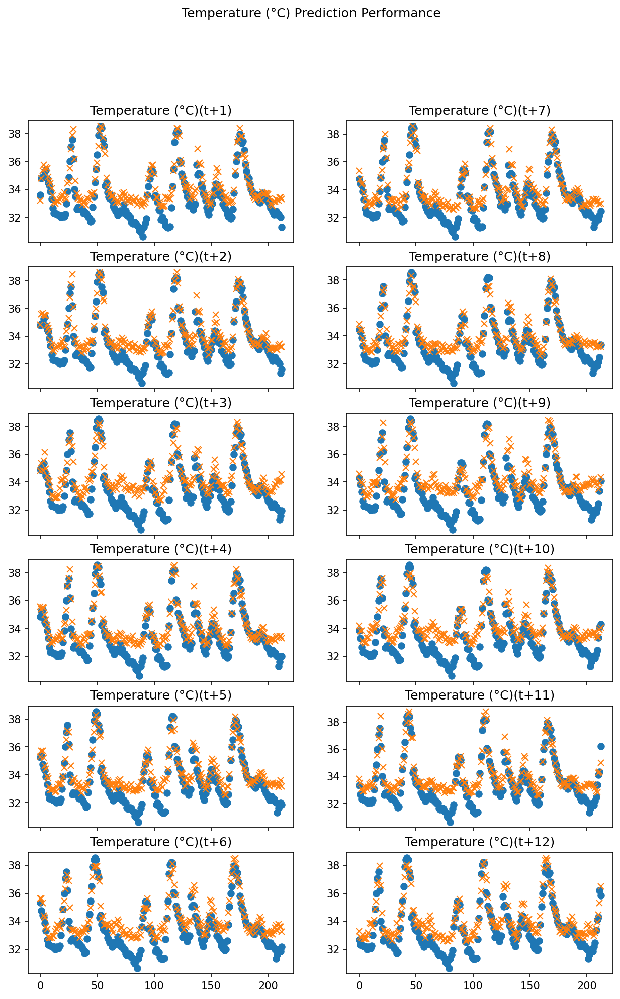

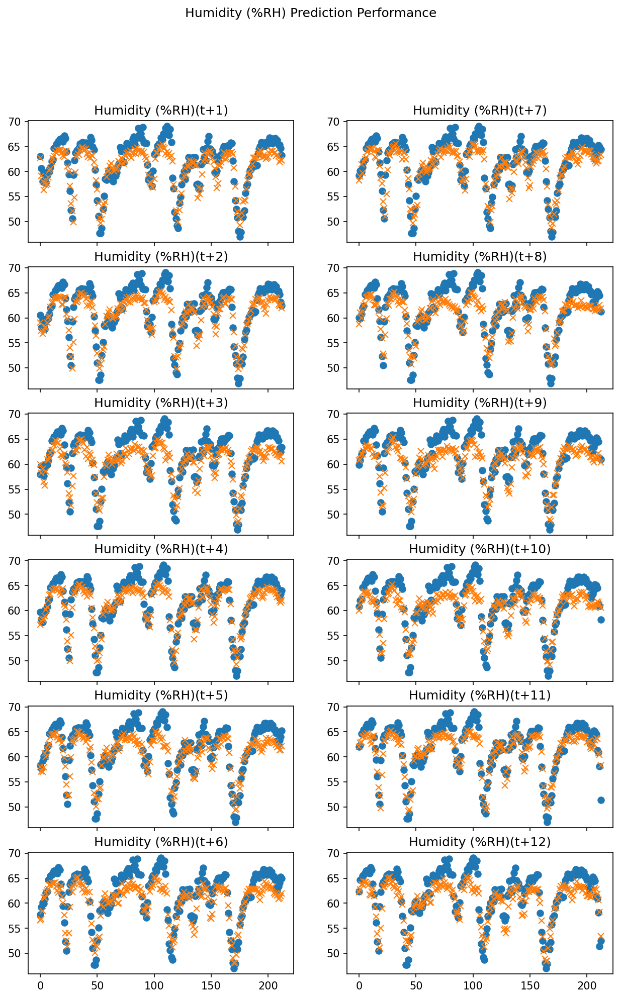

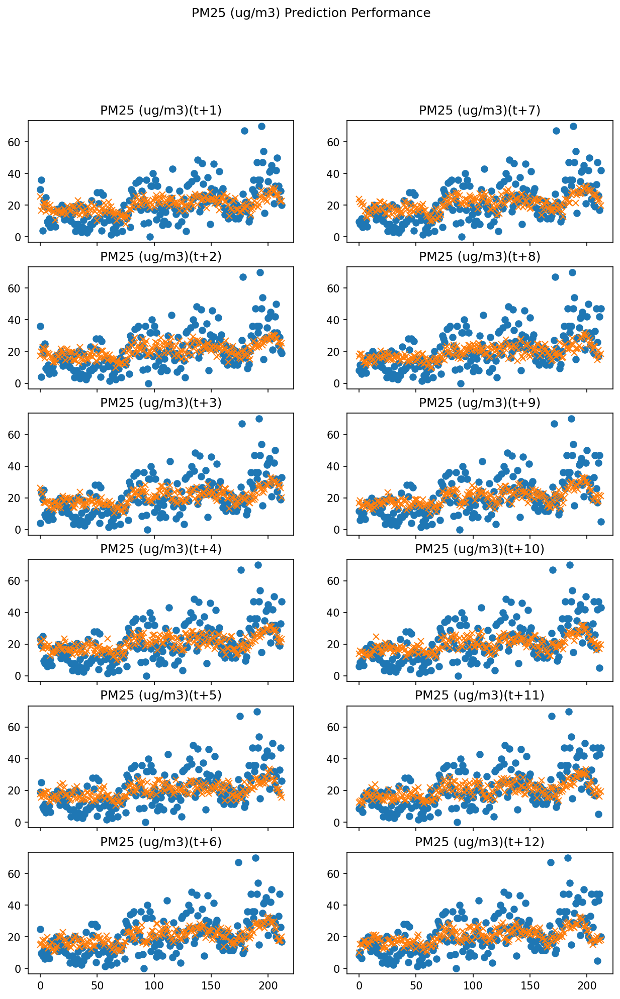

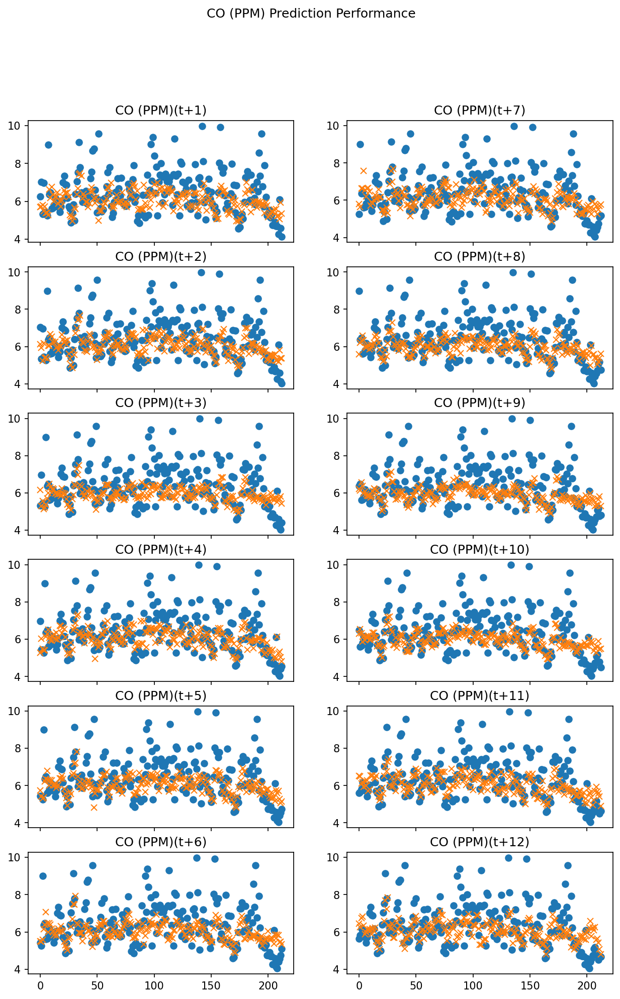

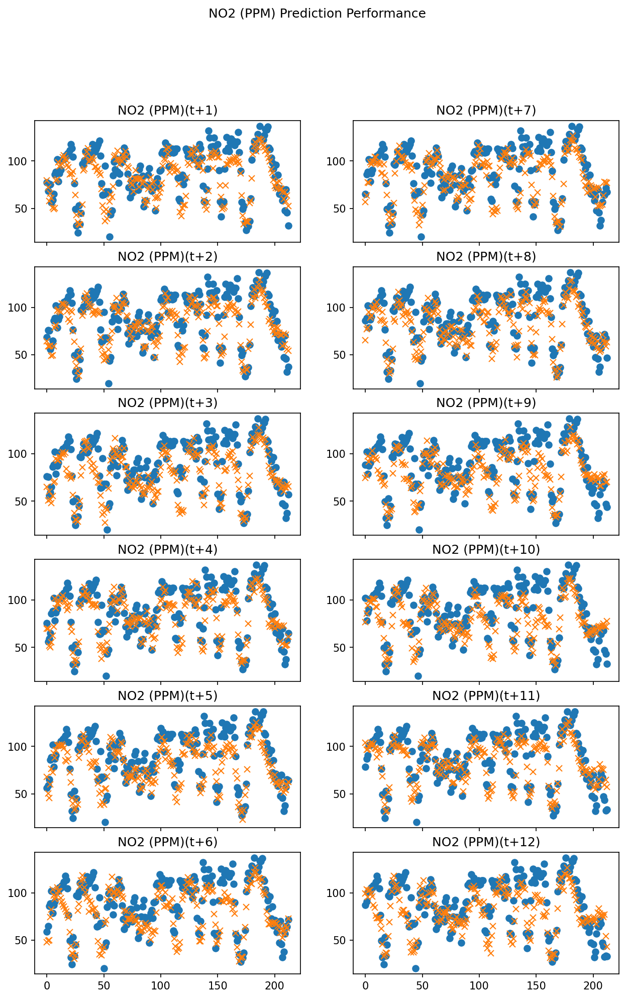

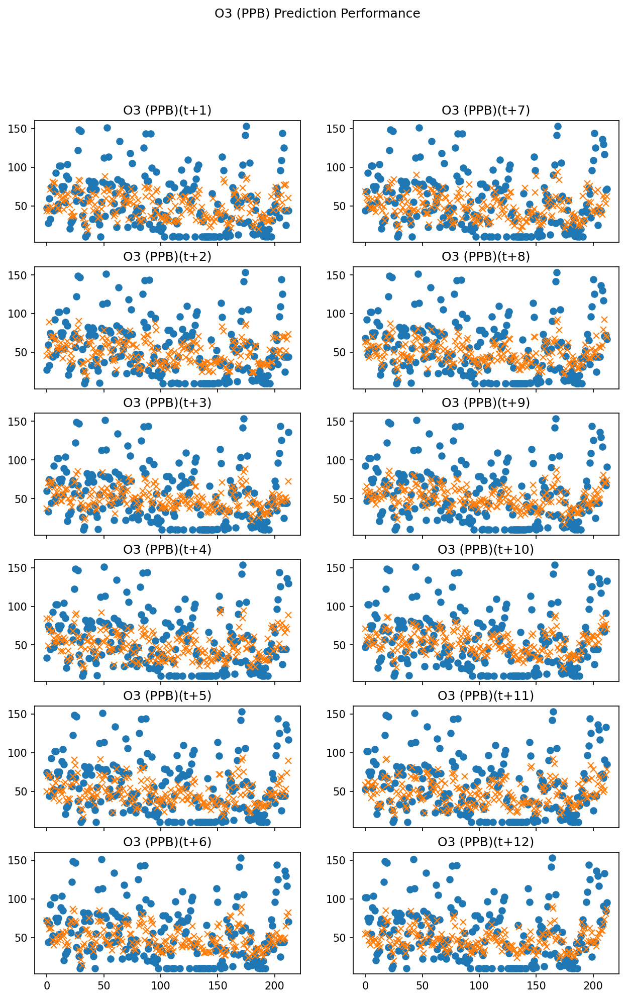

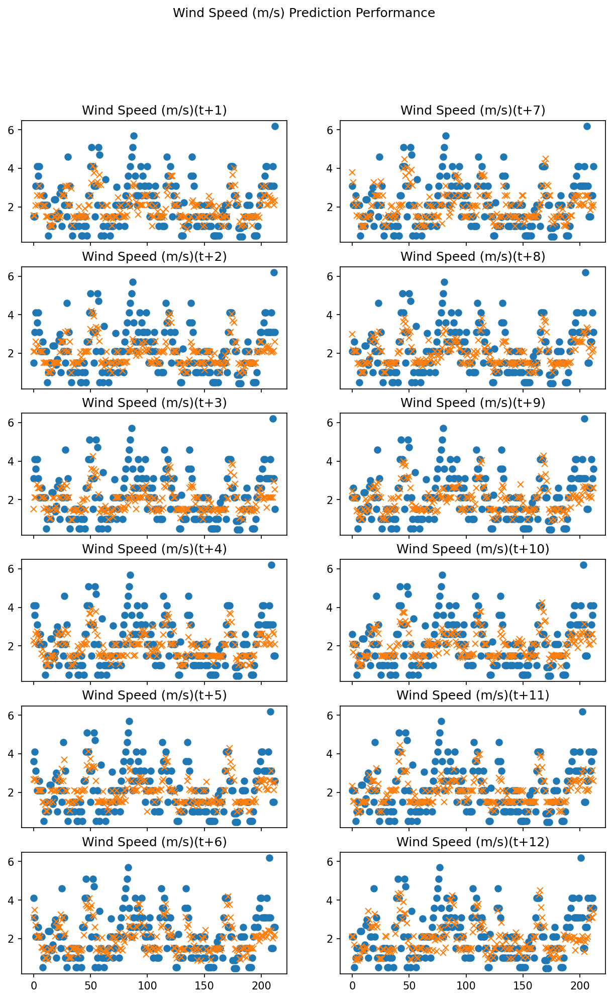

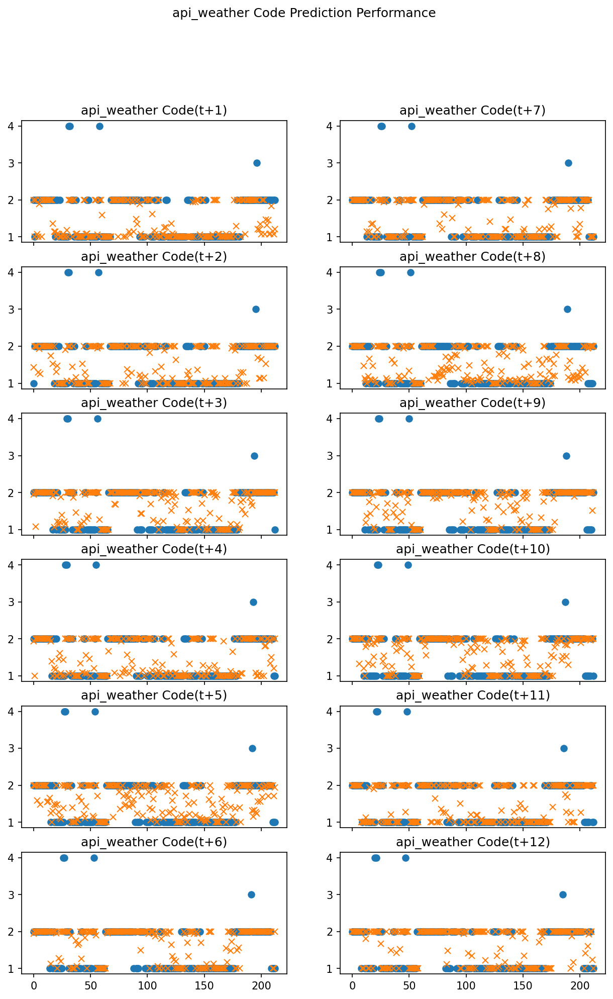

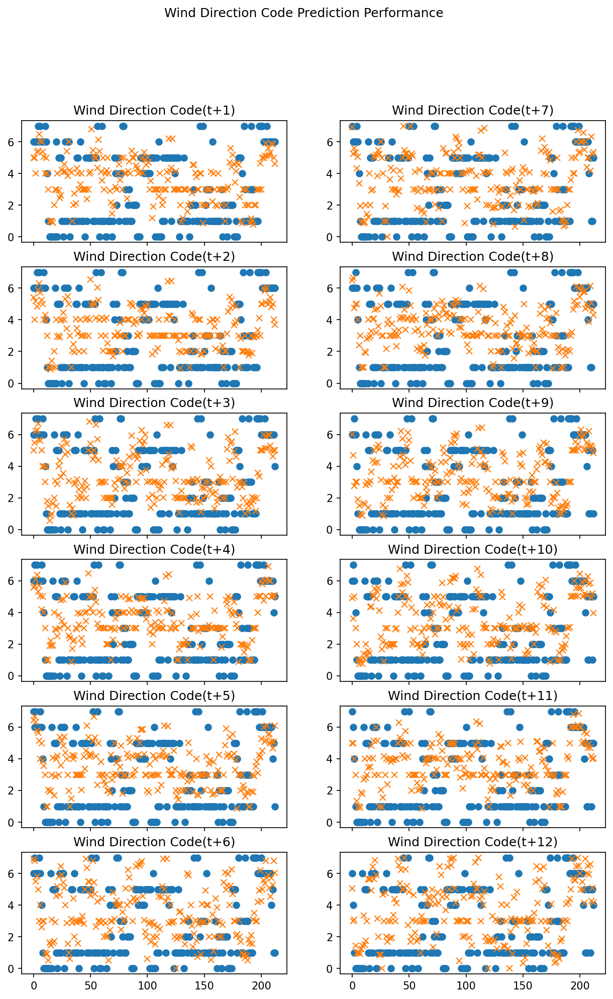

In [328]:
t = np.arange(0, len(x_test_at_time['t+1']))
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
for label_name in cols:
    row, col = 0, 0
    fig, ax = plt.subplots(nrows=6,ncols=2, sharex=True, figsize=(10,15), dpi=150)
    fig.suptitle('{} Prediction Performance'.format(label_name))
    for time_step in predictor.predictors:
        x_test = x_test_at_time[time_step]
        time_step_num = int(time_step.split('+')[1])
        preds = predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        ax[row][col].set_title('{}({})'.format(label_name, time_step))
        ax[row][col].plot(t, y_test_time, 'o')
        ax[row][col].plot(t, y_pred_time, 'x')
        if row < 5:
            row += 1
        else:
            row = 0
            col = col + 1 if col < 1 else 0
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

### Save the model for later use

In [329]:
import os

In [330]:
root_folder = 'ml_models_ts'
model_name = 'ensemble_stacking'
dir_name = os.path.join(root_folder, model_name)
model_to_dump = ensemble_at_time

In [331]:
# save the model to disk
# try to create directory if not created yet
if not os.path.exists(dir_name):
    try:
        os.makedirs(dir_name)
    except OSError:
        print ("Creation of the directory %s failed" % dir_name)
    else:
        print ("Successfully created the directory %s" % dir_name)
for idx, model in enumerate(model_to_dump.values()):
    file_name = '{}_t{}_model.sav'.format(model_name, idx + 1)
    file_path = os.path.join(dir_name, file_name)
    joblib.dump(model, file_path)
    print('Dumped model into file ({})'.format(file_path))
print('done!')

Successfully created the directory ml_models_ts\ensemble_stacking
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t1_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t2_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t3_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t4_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t5_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t6_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t7_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t8_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t9_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble_stacking_t10_model.sav)
Dumped model into file (ml_models_ts\ensemble_stacking\ensemble

### try to load model

In [66]:
import os

In [67]:
loaded_model = {}
root_folder = 'ml_models'
model_name = 'ensemble_stacking'
dir_name = os.path.join(root_folder, model_name)

In [68]:
for time_idx in range(1, 13, 1):
    file_name = '{}_t{}_model.sav'.format(model_name, time_idx)
    file_path = os.path.join(dir_name, file_name)
    if os.path.exists(file_path):
        loaded_model['t+{}'.format(time_idx)] = joblib.load(file_path)
        print('Loaded model from file {}'.format(file_name))
    else:
        continue
if loaded_model:
    ensemble_at_time = loaded_model
else:
    print('warning! nothing loaded in model.')
print('done!')

Loaded model from file ensemble_stacking_t1_model.sav
Loaded model from file ensemble_stacking_t2_model.sav
Loaded model from file ensemble_stacking_t3_model.sav
Loaded model from file ensemble_stacking_t4_model.sav
Loaded model from file ensemble_stacking_t5_model.sav
Loaded model from file ensemble_stacking_t6_model.sav
Loaded model from file ensemble_stacking_t7_model.sav
Loaded model from file ensemble_stacking_t8_model.sav
Loaded model from file ensemble_stacking_t9_model.sav
Loaded model from file ensemble_stacking_t10_model.sav
Loaded model from file ensemble_stacking_t11_model.sav
Loaded model from file ensemble_stacking_t12_model.sav
done!


# Do some statistical testing on the ensemble model vs the recurrent SVR

In [337]:
from scipy import stats

In [338]:
# build predictors
rsvr_predictor = Predictor('recurrent', rsvr_at_time)
ensemble_predictor = Predictor('recurrent', ensemble_at_time)

In [339]:
# gather plcc for recurrent svr
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
rsvr_plcc = {}
for label_name in cols:
    print('PLCC for {}'.format(label_name))
    rsvr_plcc[label_name] = list()
    for time_step in rsvr_predictor.predictors:
        x_test = x_test_at_time[time_step]
        time_step_num = int(time_step.split('+')[1])
        preds = rsvr_predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        rsvr_plcc[label_name].append(plcc[0])
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for Temperature (°C)
Model(t+1): (0.9509988946738712, 1.5838896985517795e-109)
Model(t+2): (0.9006056576904681, 2.685588371313052e-78)
Model(t+3): (0.8076873109886703, 2.632133842208562e-50)
Model(t+4): (0.6827766820873148, 1.388397104892284e-30)
Model(t+5): (0.5361278128372865, 3.007523406001047e-17)
Model(t+6): (0.39422860652883923, 2.4768013121449234e-09)
Model(t+7): (0.27744277301682685, 4.0218913928823314e-05)
Model(t+8): (0.20357361517747327, 0.0028367485445394782)
Model(t+9): (0.16629263549494447, 0.01511463194843793)
Model(t+10): (0.15740538119174932, 0.021557105738056144)
Model(t+11): (0.2036458016440296, 0.002826738431697568)
Model(t+12): (0.21779267400049862, 0.0013821339643573327)
PLCC for Humidity (%RH)
Model(t+1): (0.9319160040036306, 6.723726391361541e-95)
Model(t+2): (0.8804543731632265, 2.5616407383282593e-70)
Model(t+3): (0.7861022471889683, 5.694117828047359e-46)
Model(t+4): (0.6589421908118875, 6.65840258231826e-28)
Model(t+5): (0.5102758701189328, 1.6076398327

In [340]:
# gather plcc for ensemble
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
ensemble_plcc = {}
for label_name in cols:
    print('PLCC for {}'.format(label_name))
    ensemble_plcc[label_name] = list()
    for time_step in ensemble_predictor.predictors:
        x_test = x_test_at_time[time_step]
        time_step_num = int(time_step.split('+')[1])
        preds = ensemble_predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        plcc = pearsonr(y_test_time, y_pred_time)
        ensemble_plcc[label_name].append(plcc[0])
        print('Model({}): {}'.format(time_step, plcc))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

PLCC for Temperature (°C)
Model(t+1): (0.9266316133900768, 1.347408643771852e-91)
Model(t+2): (0.811146208650493, 4.725949818038154e-51)
Model(t+3): (0.6492655139494367, 6.974159199872362e-27)
Model(t+4): (0.4029808670939913, 1.011041856373605e-09)
Model(t+5): (0.1416632100153191, 0.03885020455509874)
Model(t+6): (-0.06528463916001598, 0.34302600572168956)
Model(t+7): (-0.25764101763182706, 0.0001432936581833827)
Model(t+8): (-0.3426128083384807, 2.946123624588467e-07)
Model(t+9): (-0.40067352590803934, 1.2836700526416749e-09)
Model(t+10): (-0.42631922821512935, 8.135575275721478e-11)
Model(t+11): (-0.4067140069804324, 6.844252111983083e-10)
Model(t+12): (-0.3520073026579642, 1.3130430304477687e-07)
PLCC for Humidity (%RH)
Model(t+1): (0.9181142698397368, 9.177692641570399e-87)
Model(t+2): (0.811669240765534, 3.6339020646107464e-51)
Model(t+3): (0.682553424869573, 1.47505605241715e-30)
Model(t+4): (0.457763125971172, 1.98235778554419e-12)
Model(t+5): (0.2156032207558207, 0.001548584635

In [341]:
print('-- PLCC two tailed t-test --')
for label_name in rsvr_plcc:
    print('-- two-tailed t-test for {} --'.format(label_name))
    ttest, pval = stats.ttest_ind(ensemble_plcc[label_name], rsvr_plcc[label_name])
    print('p-val = {}, stats = {}'.format(pval, ttest))
    if abs(pval) > 0.05:
        print("==both are statistically insignificant")
    elif ttest < 0.0:
        print("==rsvr_plcc is superior")
    else:
        print("==(!!!) ensemble is superior") 

-- PLCC two tailed t-test --
-- two-tailed t-test for Temperature (°C) --
p-val = 0.02936132853820312, stats = -2.3302929115993547
==rsvr_plcc is superior
-- two-tailed t-test for Humidity (%RH) --
p-val = 0.05050144061018689, stats = -2.0689404152693607
==both are statistically insignificant
-- two-tailed t-test for PM25 (ug/m3) --
p-val = 0.9524811962961547, stats = 0.060274517549115184
==both are statistically insignificant
-- two-tailed t-test for CO (PPM) --
p-val = 0.6540853345774407, stats = -0.4542690721767828
==both are statistically insignificant
-- two-tailed t-test for NO2 (PPM) --
p-val = 0.1471248714805958, stats = -1.5027428651650747
==both are statistically insignificant
-- two-tailed t-test for O3 (PPB) --
p-val = 0.031501486598272115, stats = -2.297095569333231
==rsvr_plcc is superior
-- two-tailed t-test for Wind Speed (m/s) --
p-val = 0.2007507376786779, stats = -1.3189500600660098
==both are statistically insignificant
-- two-tailed t-test for api_weather Code --
p

In [342]:
# gather rmse for recurrent svr
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
rsvr_rmse = {}
for label_name in cols:
    print('RMSE for {}'.format(label_name))
    rsvr_rmse[label_name] = list()
    for time_step in rsvr_predictor.predictors:
        x_test = x_test_at_time[time_step]
        time_step_num = int(time_step.split('+')[1])
        preds = rsvr_predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        rsvr_rmse[label_name].append(rmse)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for Temperature (°C)
Model(t+1): 0.6540555986467355
Model(t+2): 1.057562430318335
Model(t+3): 1.536705883030983
Model(t+4): 2.075222246363107
Model(t+5): 2.673545008675629
Model(t+6): 3.4249116364734893
Model(t+7): 4.719768006398146
Model(t+8): 7.976458414737479
Model(t+9): 17.27610861709171
Model(t+10): 27.688836768779968
Model(t+11): 43.9492971327566
Model(t+12): 41.92777708362197
RMSE for Humidity (%RH)
Model(t+1): 1.9474552878157918
Model(t+2): 2.859321579042121
Model(t+3): 4.034749423753088
Model(t+4): 5.359669142777586
Model(t+5): 6.815053947638666
Model(t+6): 8.61599237337584
Model(t+7): 11.51279027296173
Model(t+8): 18.270250240790098
Model(t+9): 30.71176544893387
Model(t+10): 46.634955678141864
Model(t+11): 54.110423762502826
Model(t+12): 44.786338269832356
RMSE for PM25 (ug/m3)
Model(t+1): 11.096011486037135
Model(t+2): 11.373491975367322
Model(t+3): 11.4460522860314
Model(t+4): 11.546000925399506
Model(t+5): 11.416255857452342
Model(t+6): 11.652120562855403
Model(t+7): 

In [343]:
# gather rmse for ensemble
cols = [val for val in dataset.columns.values if val != 'date']
target_idx = 0
ensemble_rmse = {}
for label_name in cols:
    print('RMSE for {}'.format(label_name))
    ensemble_rmse[label_name] = list()
    for time_step in ensemble_predictor.predictors:
        x_test = x_test_at_time[time_step]
        time_step_num = int(time_step.split('+')[1])
        preds = ensemble_predictor.predict(x_test, time_step_num)
        y_pred_time = [ preds[forecast_idx][target_idx] for forecast_idx in range(preds.shape[0]) ]
        y_test_time = y_test_at_time[time_step].iloc[:, target_idx]
        rmse = mean_squared_error(y_test_time, y_pred_time, squared=False)
        ensemble_rmse[label_name].append(rmse)
        print('Model({}): {}'.format(time_step, rmse))
    if target_idx < len(cols):
        target_idx += 1
    else:
        target_idx = 0

RMSE for Temperature (°C)
Model(t+1): 0.9701155428034114
Model(t+2): 1.5932222740891733
Model(t+3): 1.9260112363574615
Model(t+4): 2.3603833683820934
Model(t+5): 2.7244293570452776
Model(t+6): 3.1030389849638076
Model(t+7): 3.4172280398599213
Model(t+8): 3.471401452793308
Model(t+9): 3.5738765532832457
Model(t+10): 3.472229507710852
Model(t+11): 3.3572869527677556
Model(t+12): 3.267206902706558
RMSE for Humidity (%RH)
Model(t+1): 2.344003262220613
Model(t+2): 3.7606671393653586
Model(t+3): 4.631525826696489
Model(t+4): 5.745187859475867
Model(t+5): 6.768184321532622
Model(t+6): 7.814726431566245
Model(t+7): 8.682577107613024
Model(t+8): 8.79879543708724
Model(t+9): 9.167434422707716
Model(t+10): 8.794024687242825
Model(t+11): 8.66898098478076
Model(t+12): 8.450664199205331
RMSE for PM25 (ug/m3)
Model(t+1): 10.889616089202462
Model(t+2): 11.014818424628878
Model(t+3): 11.412646534724432
Model(t+4): 11.613282319202268
Model(t+5): 11.450823176679792
Model(t+6): 11.61588844517813
Model(t+7

In [344]:
print('-- RMSE two tailed t-test --')
for label_name in rsvr_plcc:
    print('-- two-tailed t-test for {} --'.format(label_name))
    ttest, pval = stats.ttest_ind(ensemble_rmse[label_name], rsvr_rmse[label_name])
    print('p-val = {}, stats = {}'.format(pval, ttest))
    if abs(pval) > 0.05:
        print("==both are statistically insignificant")
    elif ttest < 0.0:
        print("==(!!!) ensemble is superior")
    else:
        print("==rsvr is superior")

-- RMSE two tailed t-test --
-- two-tailed t-test for Temperature (°C) --
p-val = 0.04077706666315146, stats = -2.173585326281099
==(!!!) ensemble is superior
-- two-tailed t-test for Humidity (%RH) --
p-val = 0.03364445392512873, stats = -2.265864990631994
==(!!!) ensemble is superior
-- two-tailed t-test for PM25 (ug/m3) --
p-val = 0.10202306565868183, stats = -1.7063435110185272
==both are statistically insignificant
-- two-tailed t-test for CO (PPM) --
p-val = 0.023913318330051173, stats = -2.426087848495085
==(!!!) ensemble is superior
-- two-tailed t-test for NO2 (PPM) --
p-val = 0.03298867565569956, stats = -2.275223911824507
==(!!!) ensemble is superior
-- two-tailed t-test for O3 (PPB) --
p-val = 0.43848915060707583, stats = -0.7890760597965405
==both are statistically insignificant
-- two-tailed t-test for Wind Speed (m/s) --
p-val = 0.021154922694929464, stats = -2.4826001928442913
==(!!!) ensemble is superior
-- two-tailed t-test for api_weather Code --
p-val = 0.0989882305